<a href="https://colab.research.google.com/github/ksBrose/3DSGroup_BootcampDataScience/blob/main/Atividade_rev.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Projeto Data Science - Grupo 3DS

Foram baixados primeiramente os arquivos de dados telemétricos das cidades de Encantado, Muçum e Santa Tereza, no período de 01/08/2023 a 31/10/2023.
Para o município de Santa Tereza, foram baixados dados de 2 estações: Santa Tereza e Linha José Julio.

**Sites Referencia**
- https://www.snirh.gov.br/hidroweb/mapa
- https://www.snirh.gov.br/hidrotelemetria/serieHistorica.aspx

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from datetime import datetime

## Base de dados de 3 meses

In [2]:
df_Encantado = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/86720000-ENCANTADO.csv', encoding='ISO-8859-1', delimiter=';')
df_Mucum = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/86510000-MUCUM.csv', encoding='ISO-8859-1', delimiter=';')
df_Sta_Tereza = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/86472600-SANTA%20TEREZA.csv', encoding='ISO-8859-1', delimiter=';')
df_Lin_JJ = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/86472000-LINHA%20JOSE%20JULIO.csv', encoding='ISO-8859-1', delimiter=';')

In [3]:
df_Encantado['Data_Hora'] = pd.to_datetime(df_Encantado['Data'] + ' ' + df_Encantado['Hora'], format='%d/%m/%Y %H:%M:%S')
df_Encantado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6071 entries, 0 to 6070
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Data          6071 non-null   object        
 1   Hora          6071 non-null   object        
 2   Chuva (mm)    6071 non-null   object        
 3   Nível (cm)    6071 non-null   object        
 4   Vazão (m3/s)  3709 non-null   object        
 5   Unnamed: 5    0 non-null      float64       
 6   Data_Hora     6071 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 332.1+ KB


In [4]:
df_Encantado.head()

,Data,Hora,Chuva (mm),Nível (cm),Vazão (m3/s),Unnamed: 5,Data_Hora
0,01/08/2023,02:30:00,0,228,251.8,NaN,2023-08-01 02:30:00
1,01/08/2023,02:45:00,0,228,251.8,NaN,2023-08-01 02:45:00
2,01/08/2023,03:00:00,0,228,251.8,NaN,2023-08-01 03:00:00
3,01/08/2023,03:15:00,0,227,248.1,NaN,2023-08-01 03:15:00
4,01/08/2023,03:30:00,0,227,248.1,NaN,2023-08-01 03:30:00


In [5]:
df_Encantado.tail()

,Data,Hora,Chuva (mm),Nível (cm),Vazão (m3/s),Unnamed: 5,Data_Hora
6066,30/10/2023,23:00:00,0,197,146.1,NaN,2023-10-30 23:00:00
6067,30/10/2023,23:15:00,0,197,146.1,NaN,2023-10-30 23:15:00
6068,30/10/2023,23:30:00,0,197,146.1,NaN,2023-10-30 23:30:00
6069,30/10/2023,23:45:00,0,197,146.1,NaN,2023-10-30 23:45:00
6070,31/10/2023,00:00:00,0,197,146.1,NaN,2023-10-31 00:00:00


Text(0, 0.5, 'Nivel')

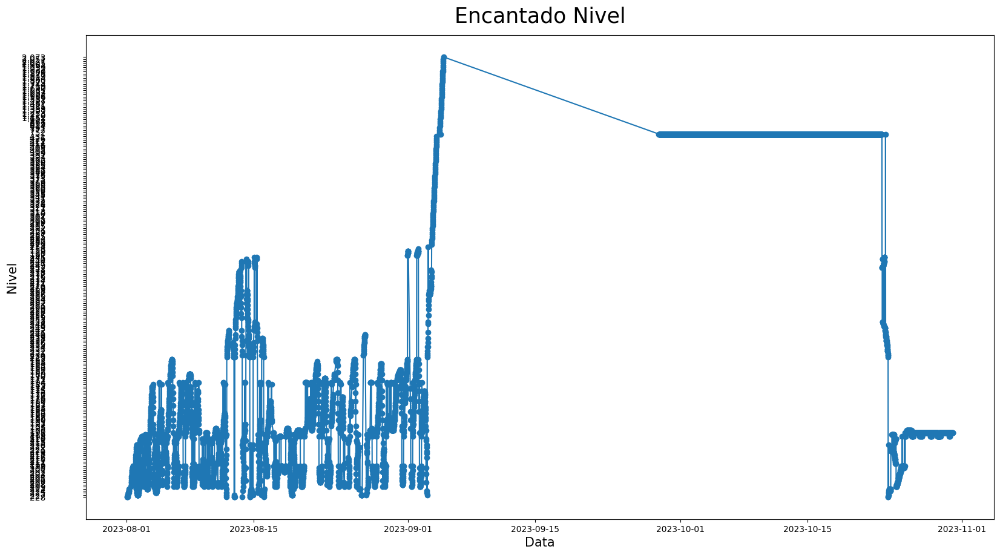

In [6]:
fig = plt.figure(figsize=(15,8))
eixo = fig.add_axes([0,0,1,1])

#eixo.scatter(df_Encantado['Data_Hora'], df_Encantado['Nível (cm)'])
eixo.plot(df_Encantado['Data_Hora'], df_Encantado['Nível (cm)'], marker='o', linestyle='-')  # 'o-' combina linha com pontos nas marcações
eixo.set_title('Encantado Nivel', fontsize=25, pad=15)
eixo.set_xlabel('Data', fontsize=15)
eixo.set_ylabel('Nivel', fontsize=15)

## Base de dados de 1 ano

In [7]:
df_Encantado24 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86720000-ENCANTADO-2024-2023.csv', encoding='ISO-8859-1', delimiter=';')
df_Encantado23 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86720000-ENCANTADO-2023-2022.csv', encoding='ISO-8859-1', delimiter=';')
df_Mucum24 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86510000-MUCUM-2024-2023.csv', encoding='ISO-8859-1', delimiter=';')
df_Mucum23 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86510000-MUCUM-2023-2022.csv', encoding='ISO-8859-1', delimiter=';')
df_Sta_Tereza24 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86472600-SANTA-TEREZA-2024-2023.csv', encoding='ISO-8859-1', delimiter=';')
df_Sta_Tereza23 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86472600-SANTA-TEREZA-2023.csv', encoding='ISO-8859-1', delimiter=';')
df_Jose_Julio24 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86472000-LINHA-JOSE-JULIO-2024-2023.csv', encoding='ISO-8859-1', delimiter=';')
df_Jose_Julio23 = pd.read_csv('https://raw.githubusercontent.com/ksBrose/3DSGroup_BootcampDataScience/master/5-86472000-LINHA-JOSE-JULIO-2023-2022.csv', encoding='ISO-8859-1', delimiter=';')

In [8]:
df_Encantado24 = df_Encantado24.drop(['Bateria(V)', 'TempInt(C)'], axis=1)
df_Encantado23 = df_Encantado23.drop(['Bateria(V)', 'TempInt(C)'], axis=1)
df_Mucum24 = df_Mucum24.drop(['Bateria(V)', 'TempInt(C)'], axis=1)
df_Mucum23 = df_Mucum23.drop(['Bateria(V)', 'TempInt(C)'], axis=1)
df_Sta_Tereza24 = df_Sta_Tereza24.drop(['Bateria(V)', 'TempInt(C)'], axis=1)
df_Sta_Tereza23 = df_Sta_Tereza23.drop(['Bateria(V)', 'TempInt(C)'], axis=1)
df_Jose_Julio24 = df_Jose_Julio24.drop(['Bateria(V)', 'TempInt(C)'], axis=1)
df_Jose_Julio23 = df_Jose_Julio23.drop(['Bateria(V)', 'TempInt(C)'], axis=1)

In [9]:
df_Encantado24.head()

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
0,23/10/2024 15:00,0.0,100.0,0.11
1,23/10/2024 14:45,0.0,100.0,0.11
2,23/10/2024 14:30,0.0,100.0,0.11
3,23/10/2024 14:15,0.0,99.0,NaN
4,23/10/2024 14:00,0.0,99.0,NaN


In [10]:
df_Encantado24.tail()

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
35119,22/10/2023 16:15,NaN,NaN,NaN
35120,22/10/2023 16:00,NaN,NaN,NaN
35121,22/10/2023 15:45,NaN,NaN,NaN
35122,22/10/2023 15:30,NaN,NaN,NaN
35123,22/10/2023 15:15,NaN,NaN,NaN


In [11]:
df_Encantado24.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35124 entries, 0 to 35123
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Data/Hora    35124 non-null  object 
 1   Chuva(mm)    34991 non-null  float64
 2   Nivel(cm)    25415 non-null  float64
 3   Vazao(m3/s)  26309 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.1+ MB


- Alterar Dtype Data/Hora para variavel datetime

In [12]:
df_Encantado24['Data/Hora'] = pd.to_datetime(df_Encantado24['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Encantado23['Data/Hora'] = pd.to_datetime(df_Encantado23['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Mucum24['Data/Hora'] = pd.to_datetime(df_Mucum24['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Mucum23['Data/Hora'] = pd.to_datetime(df_Mucum23['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Sta_Tereza24['Data/Hora'] = pd.to_datetime(df_Sta_Tereza24['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Sta_Tereza23['Data/Hora'] = pd.to_datetime(df_Sta_Tereza23['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Jose_Julio24['Data/Hora'] = pd.to_datetime(df_Jose_Julio24['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Jose_Julio23['Data/Hora'] = pd.to_datetime(df_Jose_Julio23['Data/Hora'], format='%d/%m/%Y %H:%M')

In [13]:
df_Encantado24.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35124 entries, 0 to 35123
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    35124 non-null  datetime64[ns]
 1   Chuva(mm)    34991 non-null  float64       
 2   Nivel(cm)    25415 non-null  float64       
 3   Vazao(m3/s)  26309 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.1 MB


In [14]:
print('Quantidade de linhas e colunas:', df_Encantado24.shape)
print('Quantidade de dados nulos:', df_Encantado24.isna().sum().sum())

Quantidade de linhas e colunas: (35124, 4)
Quantidade de dados nulos: 18657


- Unindo as bases de dados de 2 anos separados em uma unica base

In [15]:
df_Encantado_unico = pd.concat([df_Encantado24, df_Encantado23]).drop_duplicates().reset_index(drop=True)
df_Encantado_unico['Data/Hora'] = pd.to_datetime(df_Encantado_unico['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Mucum_unico = pd.concat([df_Mucum24, df_Mucum23]).drop_duplicates().reset_index(drop=True)
df_Mucum_unico['Data/Hora'] = pd.to_datetime(df_Mucum_unico['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Sta_Tereza_unico = pd.concat([df_Sta_Tereza24, df_Sta_Tereza23]).drop_duplicates().reset_index(drop=True)
df_Sta_Tereza_unico['Data/Hora'] = pd.to_datetime(df_Sta_Tereza_unico['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Jose_Julio_unico = pd.concat([df_Jose_Julio24, df_Jose_Julio23]).drop_duplicates().reset_index(drop=True)
df_Jose_Julio_unico['Data/Hora'] = pd.to_datetime(df_Jose_Julio_unico['Data/Hora'], format='%d/%m/%Y %H:%M')
df_Encantado_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64814 entries, 0 to 64813
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    64814 non-null  datetime64[ns]
 1   Chuva(mm)    62248 non-null  float64       
 2   Nivel(cm)    52718 non-null  float64       
 3   Vazao(m3/s)  53612 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.0 MB


In [16]:
df_Mucum_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69397 entries, 0 to 69396
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    69397 non-null  datetime64[ns]
 1   Chuva(mm)    69201 non-null  float64       
 2   Nivel(cm)    68913 non-null  float64       
 3   Vazao(m3/s)  68913 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.1 MB


In [17]:
df_Sta_Tereza_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37003 entries, 0 to 37002
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    37003 non-null  datetime64[ns]
 1   Chuva(mm)    36961 non-null  float64       
 2   Nivel(cm)    36870 non-null  float64       
 3   Vazao(m3/s)  0 non-null      float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.1 MB


In [18]:
df_Jose_Julio_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67289 entries, 0 to 67288
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    67289 non-null  datetime64[ns]
 1   Chuva(mm)    66981 non-null  float64       
 2   Nivel(cm)    55443 non-null  float64       
 3   Vazao(m3/s)  55443 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.1 MB


In [19]:
df_Encantado_unico.head()

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
0,2024-10-23 15:00:00,0.0,100.0,0.11
1,2024-10-23 14:45:00,0.0,100.0,0.11
2,2024-10-23 14:30:00,0.0,100.0,0.11
3,2024-10-23 14:15:00,0.0,99.0,NaN
4,2024-10-23 14:00:00,0.0,99.0,NaN


In [20]:
df_Encantado_unico.tail()

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
64809,2022-10-22 16:15:00,0.0,223.0,233.2
64810,2022-10-22 16:00:00,0.0,224.0,236.9
64811,2022-10-22 15:45:00,0.0,226.0,244.3
64812,2022-10-22 15:30:00,0.0,226.0,244.3
64813,2022-10-22 15:15:00,0.0,227.0,248.1


# Tratamento de dados chuva e vazao

In [21]:
df_Encantado_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64814 entries, 0 to 64813
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    64814 non-null  datetime64[ns]
 1   Chuva(mm)    62248 non-null  float64       
 2   Nivel(cm)    52718 non-null  float64       
 3   Vazao(m3/s)  53612 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.0 MB


Para chuva vamos substituir valores nulos por zeros

In [22]:
df_Encantado_unico['Chuva(mm)'] = df_Encantado_unico['Chuva(mm)'].fillna(0)
df_Mucum_unico['Chuva(mm)'] = df_Mucum_unico['Chuva(mm)'].fillna(0)
df_Sta_Tereza_unico['Chuva(mm)'] = df_Sta_Tereza_unico['Chuva(mm)'].fillna(0)
df_Jose_Julio_unico['Chuva(mm)'] = df_Jose_Julio_unico['Chuva(mm)'].fillna(0)


para vazão vamos interpolar os valores nulos

In [23]:
df_Encantado_unico['Vazao(m3/s)'] = df_Encantado_unico['Vazao(m3/s)'].interpolate(method='linear')
df_Mucum_unico['Vazao(m3/s)'] = df_Mucum_unico['Vazao(m3/s)'].interpolate(method='linear')
df_Sta_Tereza_unico['Vazao(m3/s)'] = df_Sta_Tereza_unico['Vazao(m3/s)'].interpolate(method='linear')
df_Jose_Julio_unico['Vazao(m3/s)'] = df_Jose_Julio_unico['Vazao(m3/s)'].interpolate(method='linear')

conferir se sobrou algum valor nulo para chuva e vazão

In [24]:
df_Encantado_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64814 entries, 0 to 64813
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    64814 non-null  datetime64[ns]
 1   Chuva(mm)    64814 non-null  float64       
 2   Nivel(cm)    52718 non-null  float64       
 3   Vazao(m3/s)  64814 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.0 MB


# SHIFT

Para remover os valores nulos do Nivel da agua nos 4 pontos de coleta de dados será necessario fazer uma combinação dos valores faltantes de cada cidade com os valores existentes das outras.

Mas para isto é necessario fazer os valores não ter difereça de data pois cada cidade atinge o maximo em tempos diferentes e cada medidor possui um ponto de referencia diferente.

*   Deslocar a data
*   Fazer que tenha niveis semelhantes



In [25]:
df_Encantado_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64814 entries, 0 to 64813
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    64814 non-null  datetime64[ns]
 1   Chuva(mm)    64814 non-null  float64       
 2   Nivel(cm)    52718 non-null  float64       
 3   Vazao(m3/s)  64814 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.0 MB


## Deslocamento a partir da data

ao deslocar as datas temos que remover as extremidades pois ficaremos com valores das datas nulos

In [26]:
import pandas as pd

def deslocar_data_series(tabela1, tabela2, tabela3, tabela4, coluna_data, shift1=0, shift2=0, shift3=0, shift4=0):
    """
    Desloca a coluna de data em cada tabela de acordo com os valores de shift fornecidos
    e remove valores nulos nas extremidades para manter todas as tabelas alinhadas.

    Parâmetros:
    - tabela1, tabela2, tabela3, tabela4: tabelas de dados pandas DataFrame.
    - coluna_data: nome da coluna de data.
    - shift1, shift2, shift3, shift4: valores de deslocamento para cada tabela (em unidades de linha).

    Retorna:
    - Quatro tabelas alinhadas e sem valores nulos nas extremidades.
    """

    # Aplicar os deslocamentos na coluna de data em cada tabela
    tabela1[coluna_data] = tabela1[coluna_data].shift(shift1)
    tabela2[coluna_data] = tabela2[coluna_data].shift(shift2)
    tabela3[coluna_data] = tabela3[coluna_data].shift(shift3)
    tabela4[coluna_data] = tabela4[coluna_data].shift(shift4)

    # Sincronizar os índices removendo valores nulos das extremidades, com base no maior deslocamento
    max_shift = max(shift1, shift2, shift3, shift4)
    min_shift = min(shift1, shift2, shift3, shift4)

    # Recortar todas as tabelas para o mesmo intervalo de dados, removendo extremidades com nulos
    tabela1 = tabela1.iloc[max_shift:min_shift].reset_index(drop=True)
    tabela2 = tabela2.iloc[max_shift:min_shift].reset_index(drop=True)
    tabela3 = tabela3.iloc[max_shift:min_shift].reset_index(drop=True)
    tabela4 = tabela4.iloc[max_shift:min_shift].reset_index(drop=True)

    return tabela1, tabela2, tabela3, tabela4

In [27]:
# Definir os deslocamentos específicos para cada tabela
shift1, shift2, shift3, shift4 = -12, -12, 7, 20

# Alinhar as tabelas
df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico = deslocar_data_series(
    df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
    coluna_data='Data/Hora',
    shift1=shift1, shift2=shift2, shift3=shift3, shift4=shift4
)

In [28]:
df_Encantado_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64782 entries, 0 to 64781
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    64782 non-null  datetime64[ns]
 1   Chuva(mm)    64782 non-null  float64       
 2   Nivel(cm)    52686 non-null  float64       
 3   Vazao(m3/s)  64782 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.0 MB


- Confirmando se os dados das extremidades foram removidos

In [29]:
df_Jose_Julio_unico.head(21)

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
0,2024-10-23 16:30:00,0.0,398.0,314.34
1,2024-10-23 16:15:00,0.0,398.0,314.34
2,2024-10-23 16:00:00,0.0,398.0,314.34
3,2024-10-23 15:45:00,0.0,398.0,314.34
4,2024-10-23 15:30:00,0.0,398.0,314.34
5,2024-10-23 15:15:00,0.0,399.0,316.64
6,2024-10-23 15:00:00,0.0,398.0,314.34
7,2024-10-23 14:45:00,0.0,398.0,314.34
8,2024-10-23 14:30:00,0.0,398.0,314.34
9,2024-10-23 14:15:00,0.0,398.0,314.34


In [30]:
df_Sta_Tereza_unico.head(21)

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
0,2024-10-23 12:15:00,0.0,257.0,NaN
1,2024-10-23 12:00:00,0.0,257.0,NaN
2,2024-10-23 11:45:00,0.0,257.0,NaN
3,2024-10-23 11:30:00,0.0,257.0,NaN
4,2024-10-23 11:15:00,0.0,257.0,NaN
5,2024-10-23 11:00:00,0.0,257.0,NaN
6,2024-10-23 10:45:00,0.0,257.0,NaN
7,2024-10-23 10:30:00,0.0,256.0,NaN
8,2024-10-23 10:15:00,0.0,256.0,NaN
9,2024-10-23 10:00:00,0.0,256.0,NaN


In [31]:
df_Mucum_unico.tail(21)

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
69344,2022-10-22 20:30:00,0.0,223.0,254.1
69345,2022-10-22 20:15:00,0.0,221.0,249.3
69346,2022-10-22 20:00:00,0.0,219.0,244.5
69347,2022-10-22 19:45:00,0.0,216.0,237.4
69348,2022-10-22 19:30:00,0.0,213.0,230.5
69349,2022-10-22 19:15:00,0.0,209.0,221.4
69350,2022-10-22 19:00:00,0.0,206.0,214.6
69351,2022-10-22 18:45:00,0.0,201.0,203.7
69352,2022-10-22 18:30:00,0.0,197.0,195.1
69353,2022-10-22 18:15:00,0.0,192.0,184.6


In [32]:
df_Encantado_unico.tail(21)

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
64761,2022-10-22 20:15:00,0.0,213.0,197.6
64762,2022-10-22 20:00:00,0.0,211.0,190.8
64763,2022-10-22 19:45:00,0.0,208.0,180.8
64764,2022-10-22 19:30:00,0.0,206.0,174.3
64765,2022-10-22 19:15:00,0.0,204.0,167.8
64766,2022-10-22 19:00:00,0.0,203.0,164.6
64767,2022-10-22 18:45:00,0.0,202.0,161.5
64768,2022-10-22 18:30:00,0.0,201.0,158.4
64769,2022-10-22 18:15:00,0.0,200.0,155.2
64770,2022-10-22 18:00:00,0.0,200.0,155.2


## Deslocamento dos dados em relação do nivel

In [33]:
def plotar_matplot4(titulo, labelx, labely, x, y, dataset1, dataset2, dataset3, dataset4, label1, label2, label3, label4, intervalo_data=None):

  fig = plt.figure(figsize=(15, 8))
  eixo = fig.add_axes([0, 0, 1, 1])

  # Filtrar o intervalo de datas, se fornecido
  if intervalo_data is not None:
      data_inicio, data_fim = intervalo_data
      dataset1 = dataset1[(dataset1[x] >= data_inicio) & (dataset1[x] <= data_fim)]
      dataset2 = dataset2[(dataset2[x] >= data_inicio) & (dataset2[x] <= data_fim)]
      dataset3 = dataset3[(dataset3[x] >= data_inicio) & (dataset3[x] <= data_fim)]
      dataset4 = dataset4[(dataset4[x] >= data_inicio) & (dataset4[x] <= data_fim)]

  # Plotar os dados com os labels fornecidos
  eixo.plot(x, y, data=dataset1, label=label1, linestyle='-')
  eixo.plot(x, y, data=dataset2, label=label2, linestyle='-')
  eixo.plot(x, y, data=dataset3, label=label3, linestyle='-')
  eixo.plot(x, y, data=dataset4, label=label4, linestyle='-')

  # Configurar título e rótulos dos eixos
  eixo.set_title(titulo, fontsize=25, pad=15)
  eixo.set_xlabel(labelx, fontsize=15)
  eixo.set_ylabel(labely, fontsize=15)

  # Adicionar a legenda
  eixo.legend()
  eixo = eixo

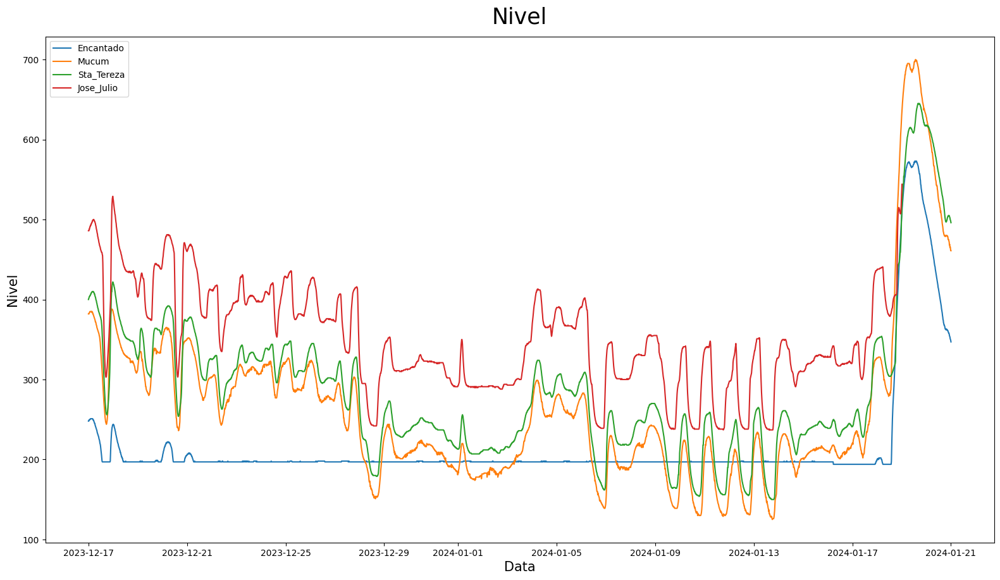

In [34]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-12-17')
data_fim = pd.to_datetime('2024-01-21')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

no grafico aciima notamos que os valores não tem diferença em questão temporal mas vemoz que possuem niveis diferentes

- Os Valores abaixo são para eles terem uma diferença geral semelhante

In [35]:
df_Encantado_unico['Nivel(cm)'] = df_Encantado_unico['Nivel(cm)'] + 180
df_Mucum_unico['Nivel(cm)'] = df_Mucum_unico['Nivel(cm)'] + 70
df_Sta_Tereza_unico['Nivel(cm)'] = df_Sta_Tereza_unico['Nivel(cm)'] + 50
df_Jose_Julio_unico['Nivel(cm)'] = df_Jose_Julio_unico['Nivel(cm)'] - 40

- Os graficos abaixo foram separados em faixa de 6 meses para facilitar a visualização

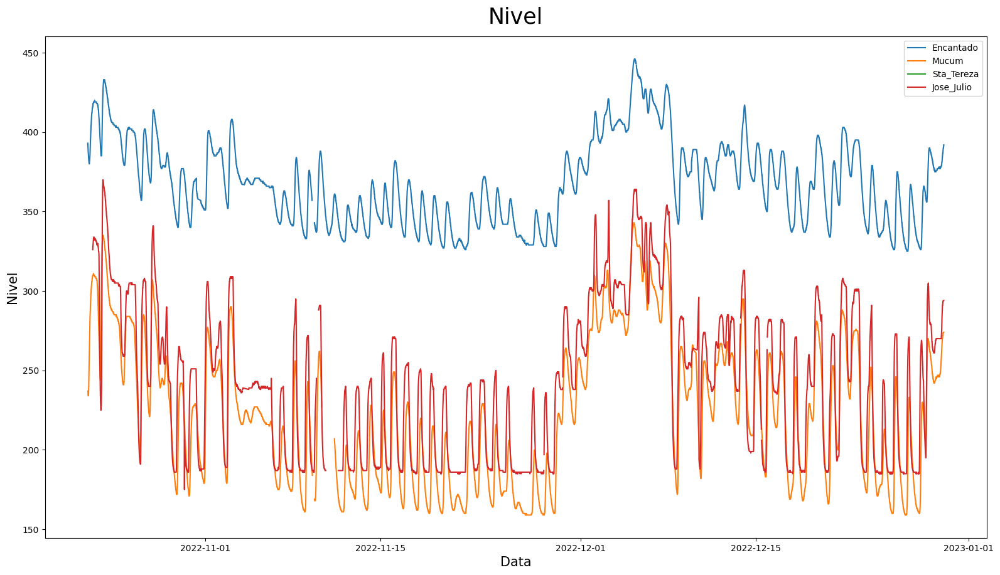

In [36]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-06-1')
data_fim = pd.to_datetime('2022-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

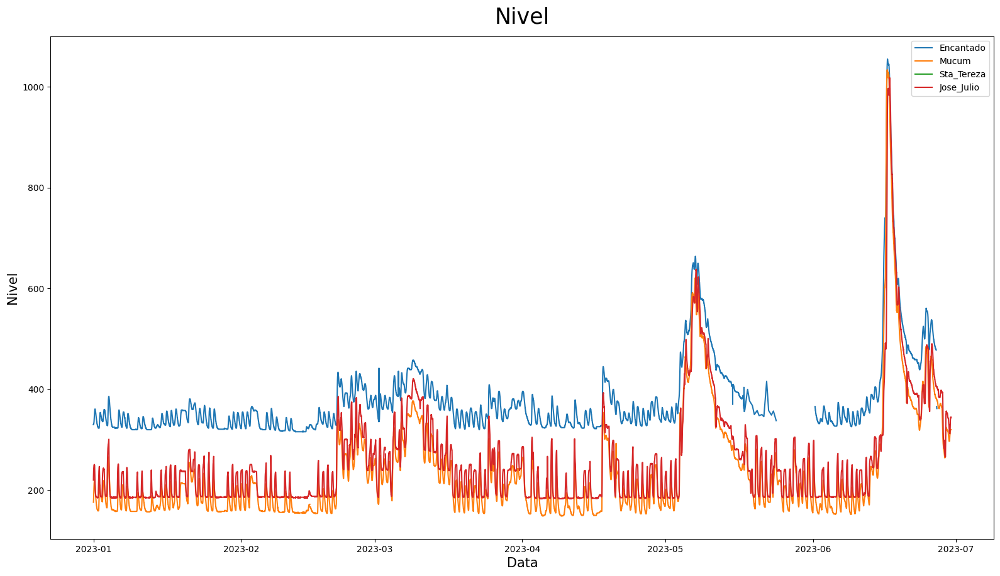

In [37]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-01-1')
data_fim = pd.to_datetime('2023-6-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

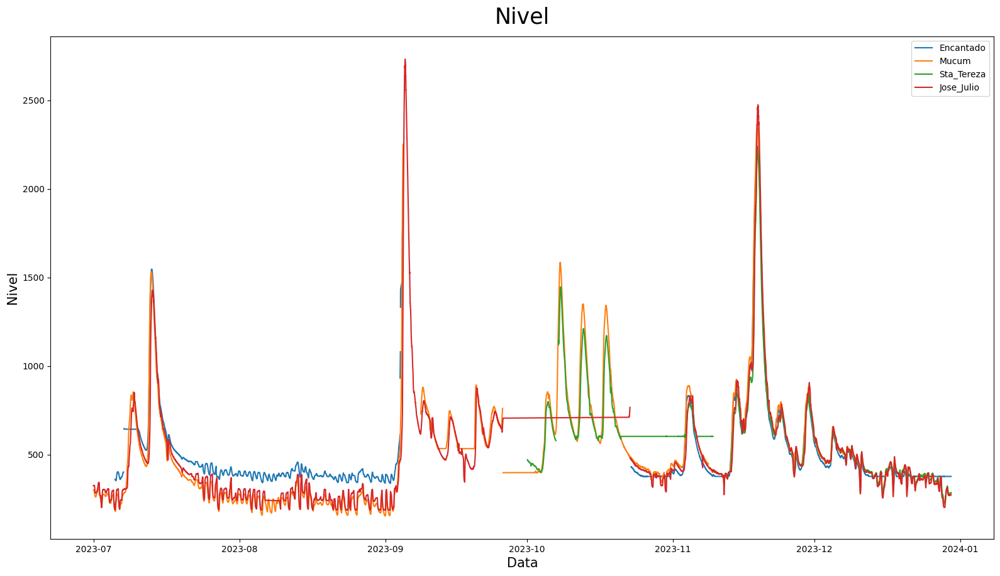

In [38]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-07-1')
data_fim = pd.to_datetime('2023-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

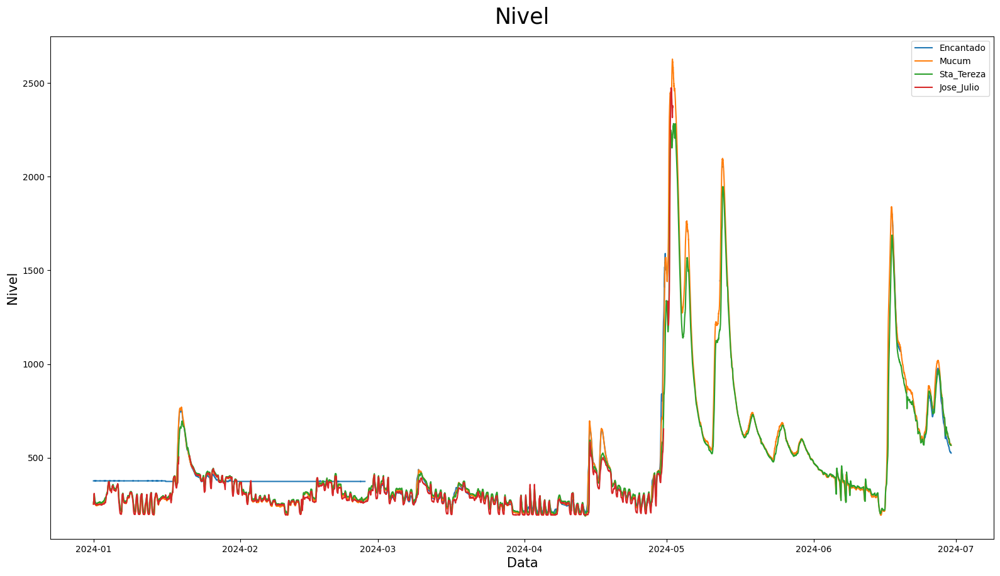

In [39]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-01-1')
data_fim = pd.to_datetime('2024-6-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

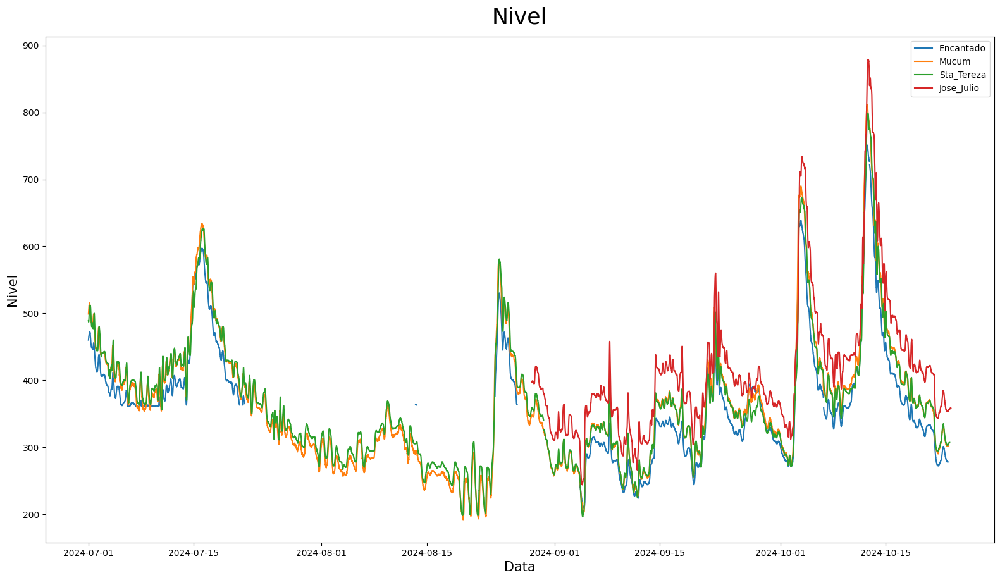

In [40]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-07-1')
data_fim = pd.to_datetime('2024-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

Foi possivel notar que em faixas temporais há diferença de altura pois o medidor deve ter sido realocado do ponto original

*   Será necessario fazer ajustes em faixas temporais especifica



In [41]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-06-1')
data_fim = pd.to_datetime('2022-12-30')

# Aplique a soma de 50 apenas para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicio) &
                        (df_Encantado_unico['Data/Hora'] <= data_fim),
                        'Nivel(cm)'] -= 100

In [42]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-06-1')
data_fim = pd.to_datetime('2022-12-30')

# Aplique a soma de 50 apenas para as linhas dentro do intervalo especificado
df_Mucum_unico.loc[(df_Mucum_unico['Data/Hora'] >= data_inicio) &
                        (df_Mucum_unico['Data/Hora'] <= data_fim),
                        'Nivel(cm)'] += 20

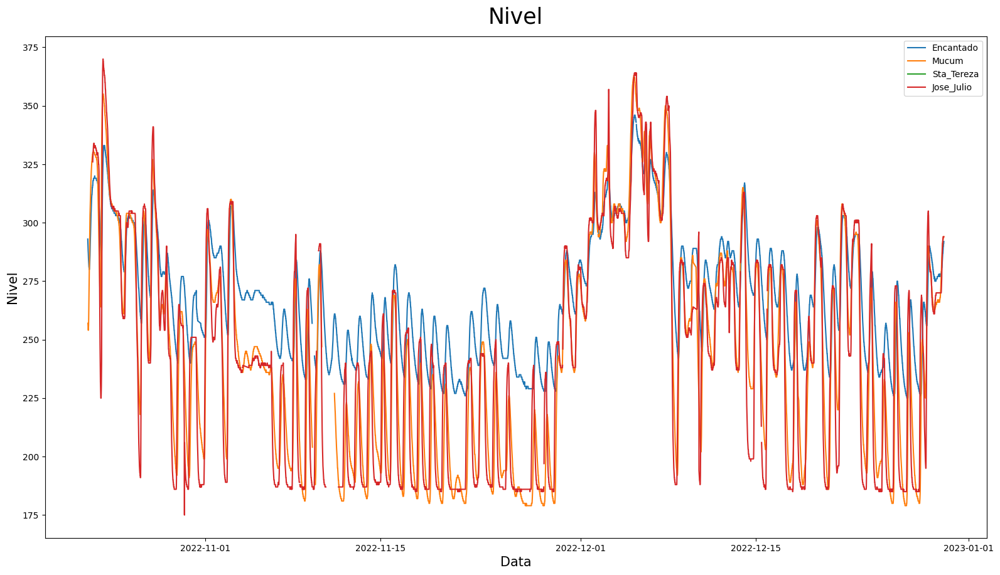

In [43]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-06-1')
data_fim = pd.to_datetime('2022-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [44]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-01-1')
data_fim = pd.to_datetime('2023-6-30')

# Aplique a soma de 50 apenas para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicio) &
                        (df_Encantado_unico['Data/Hora'] <= data_fim),
                        'Nivel(cm)'] -= 100

In [45]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-01-1')
data_fim = pd.to_datetime('2023-6-30')

# Aplique a soma de 50 apenas para as linhas dentro do intervalo especificado
df_Mucum_unico.loc[(df_Mucum_unico['Data/Hora'] >= data_inicio) &
                        (df_Mucum_unico['Data/Hora'] <= data_fim),
                        'Nivel(cm)'] += 20

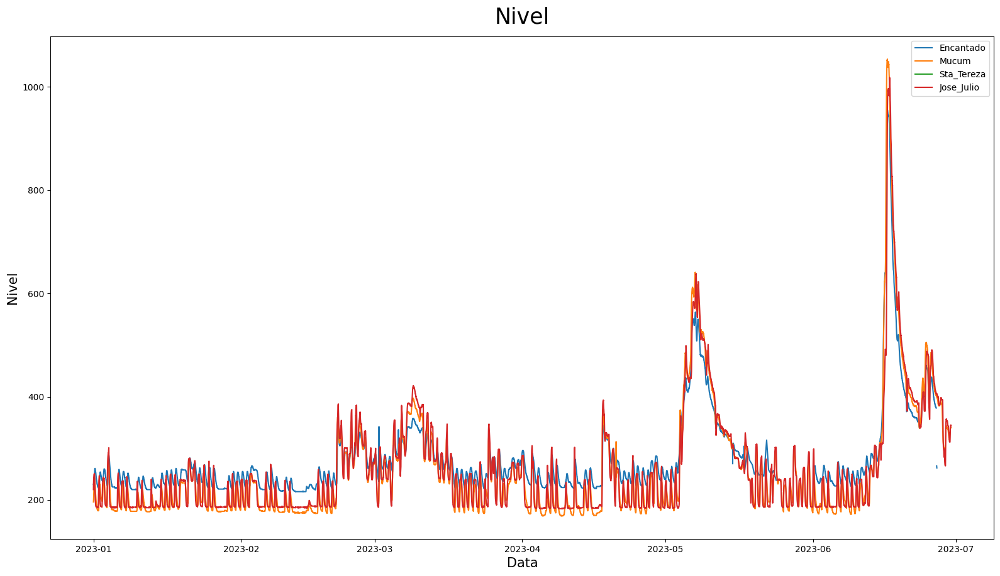

In [46]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-01-1')
data_fim = pd.to_datetime('2023-6-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [47]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-07-1')
data_fim = pd.to_datetime('2023-10-30')

# Aplique a soma de 50 apenas para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicio) &
                        (df_Encantado_unico['Data/Hora'] <= data_fim),
                        'Nivel(cm)'] -= 100

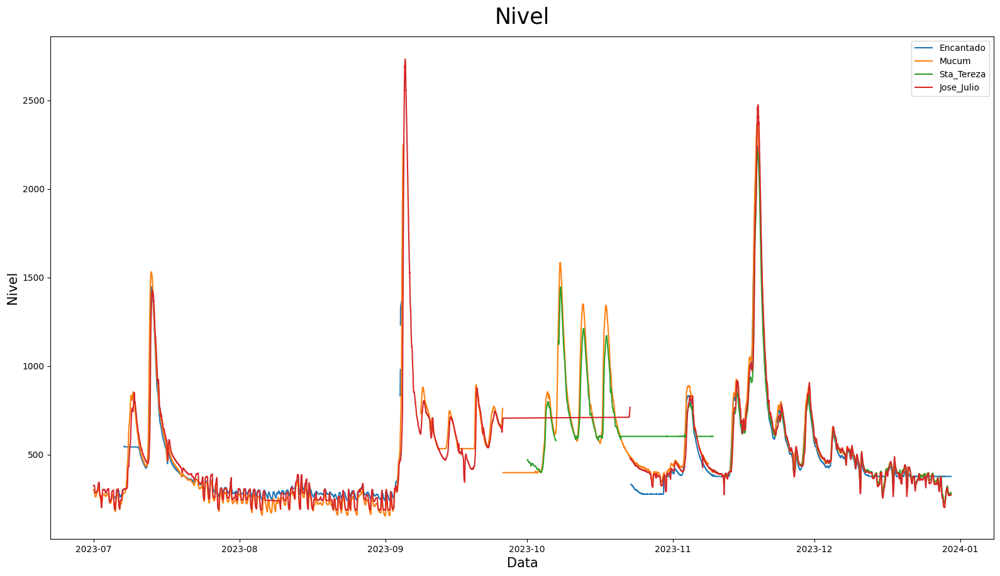

In [48]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-07-1')
data_fim = pd.to_datetime('2023-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [49]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-06-20')
data_fim = pd.to_datetime('2024-12-30')

# Aplique a soma de 50 apenas para as linhas dentro do intervalo especificado
df_Jose_Julio_unico.loc[(df_Jose_Julio_unico['Data/Hora'] >= data_inicio) &
                        (df_Jose_Julio_unico['Data/Hora'] <= data_fim),
                        'Nivel(cm)'] -= 40

In [50]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2024-8-1')
data_final = pd.to_datetime('2024-8-15')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicial) &
                        (df_Encantado_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

In [51]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-06-20')
data_fim = pd.to_datetime('2024-12-30')

# Aplique a soma de 50 apenas para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicio) &
                        (df_Encantado_unico['Data/Hora'] <= data_fim),
                        'Nivel(cm)'] += 20

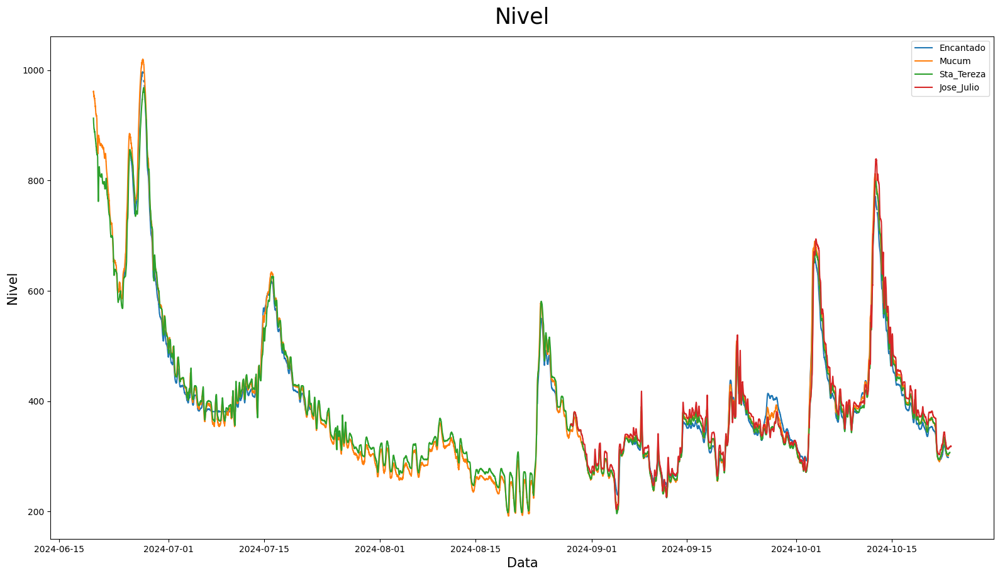

In [52]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-06-20')
data_fim = pd.to_datetime('2024-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

## Fazendo correção nos graficos

Nos graficos há medidas constantes não refletindo na realidade, provavelmente falha no medidor
- Vamos remover estes valores

In [53]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2023-06-26')
data_final = pd.to_datetime('2023-7-11')
# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicial) &
                        (df_Encantado_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

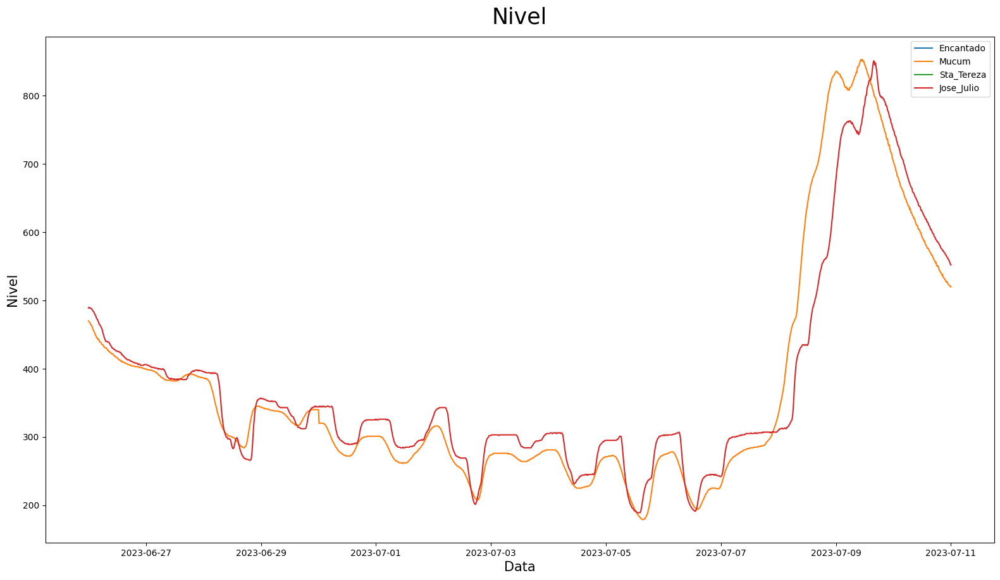

In [54]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-06-26')
data_fim = pd.to_datetime('2023-7-11')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [55]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2023-09-25 19:00')
data_final = pd.to_datetime('2023-10-23')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Jose_Julio_unico.loc[(df_Jose_Julio_unico['Data/Hora'] >= data_inicial) &
                        (df_Jose_Julio_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

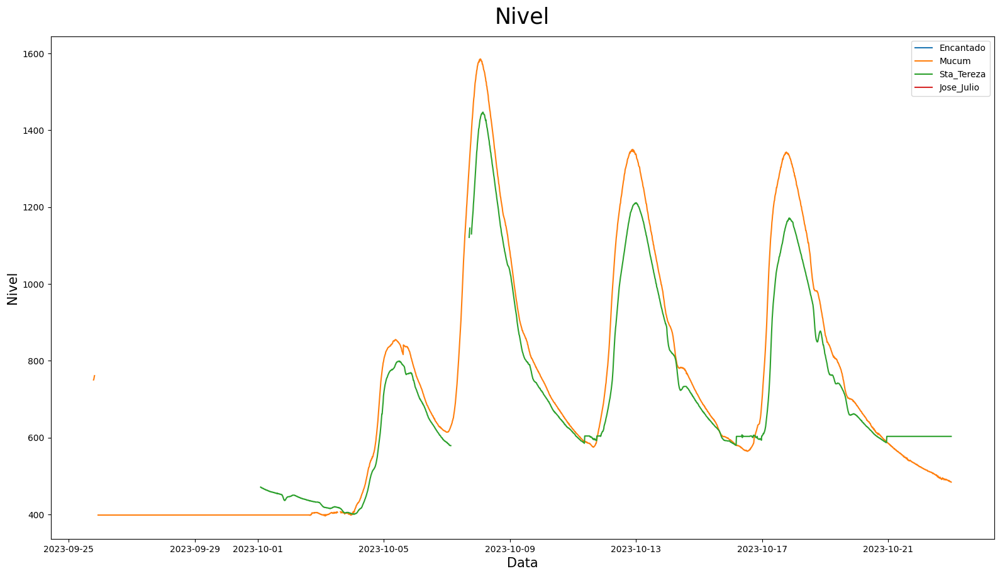

In [56]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-09-25 19:00')
data_fim = pd.to_datetime('2023-10-23')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [57]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2023-09-25 19:00')
data_final = pd.to_datetime('2023-10-2 18:00')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Mucum_unico.loc[(df_Mucum_unico['Data/Hora'] >= data_inicial) &
                        (df_Mucum_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

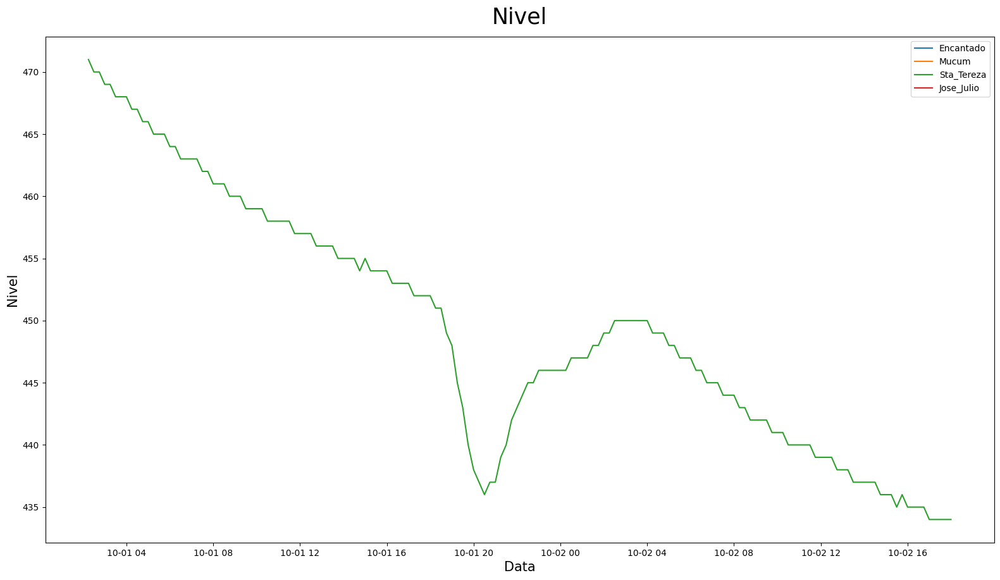

In [58]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-09-25 19:00')
data_fim = pd.to_datetime('2023-10-2 18:00')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [59]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2023-10-20 22:00')
data_final = pd.to_datetime('2023-11-3 20:00')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Sta_Tereza_unico.loc[(df_Sta_Tereza_unico['Data/Hora'] >= data_inicial) &
                        (df_Sta_Tereza_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

In [60]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2023-10-20 22:00')
data_final = pd.to_datetime('2023-10-31 16:00')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicial) &
                        (df_Encantado_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

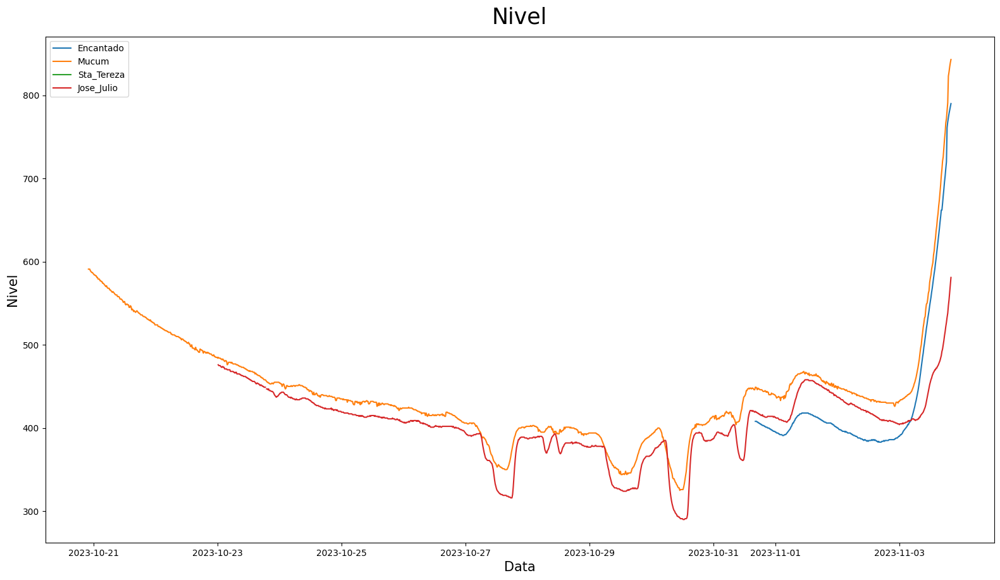

In [61]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-10-20 22:00')
data_fim = pd.to_datetime('2023-11-3 20:00')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [62]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2023-11-6')
data_final = pd.to_datetime('2023-11-9 16:00')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Sta_Tereza_unico.loc[(df_Sta_Tereza_unico['Data/Hora'] >= data_inicial) &
                        (df_Sta_Tereza_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

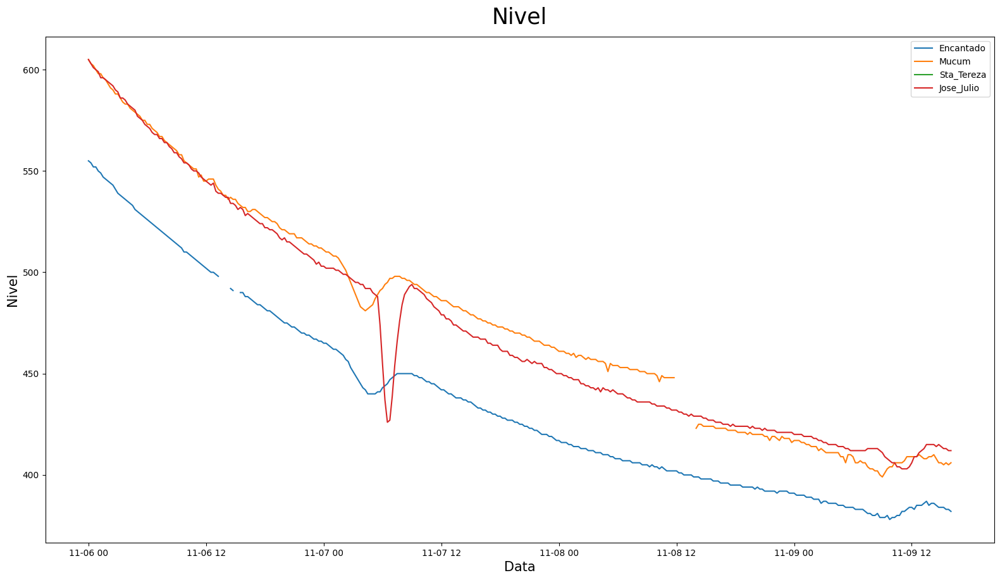

In [63]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-6')
data_fim = pd.to_datetime('2023-11-9 16:00')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

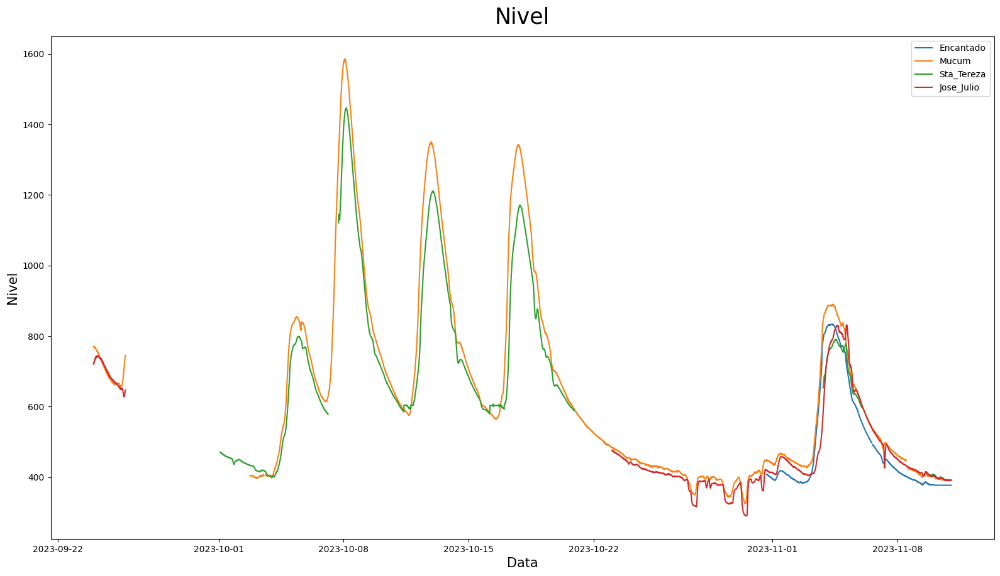

In [64]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-09-24')
data_fim = pd.to_datetime('2023-11-11')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [65]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2023-12-11 12:00')
data_final = pd.to_datetime('2024-1-18 15:00')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicial) &
                        (df_Encantado_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

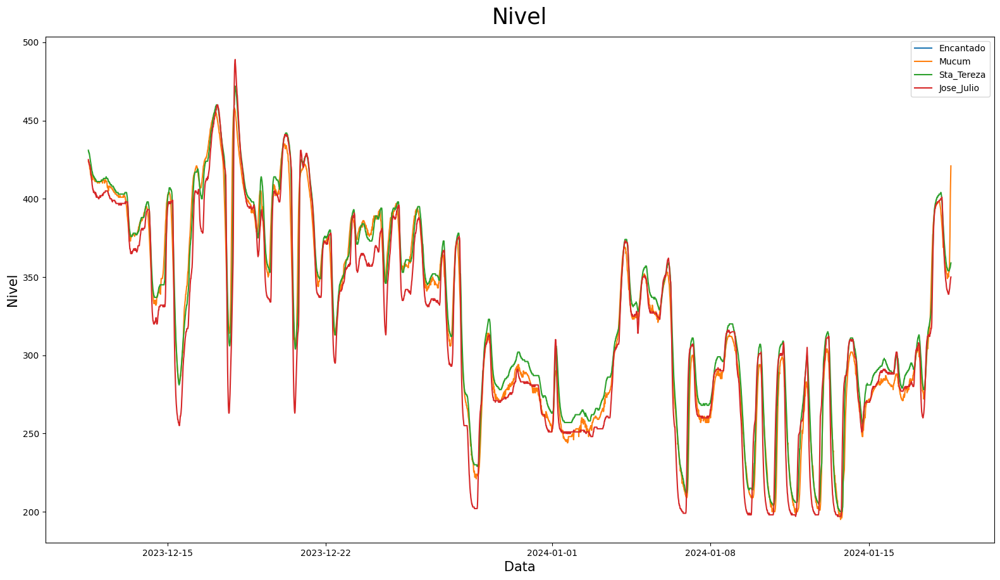

In [66]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-12-11 12:00')
data_fim = pd.to_datetime('2024-1-18 15:00')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [67]:
# Definir intervalo de data
data_inicial = pd.to_datetime('2024-1-26 12:00')
data_final = pd.to_datetime('2024-2-27 18:00')

# Defina os valores como nulos para as linhas dentro do intervalo especificado
df_Encantado_unico.loc[(df_Encantado_unico['Data/Hora'] >= data_inicial) &
                        (df_Encantado_unico['Data/Hora'] <= data_final),
                        'Nivel(cm)'] = np.nan

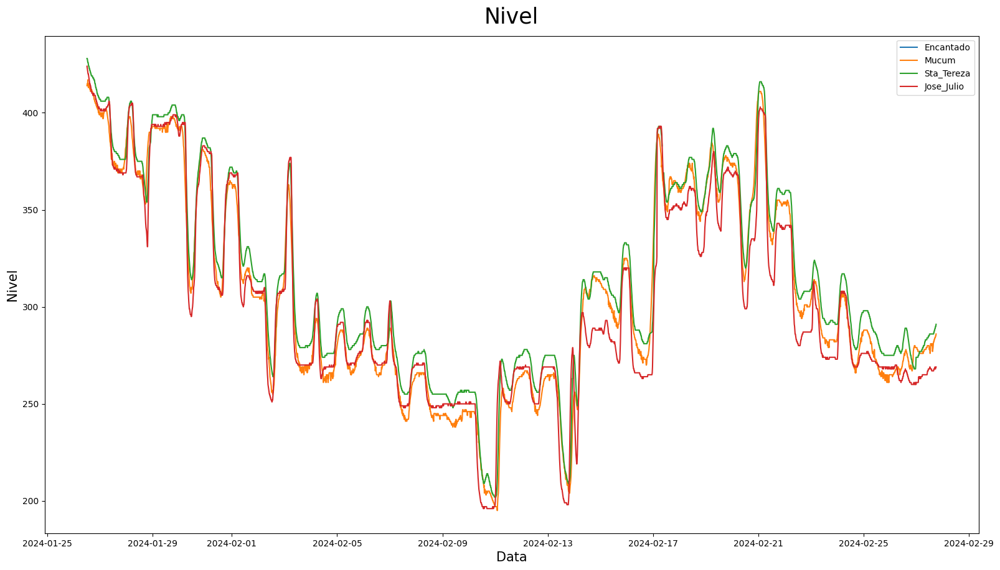

In [68]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-1-26 12:00')
data_fim = pd.to_datetime('2024-2-27 18:00')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

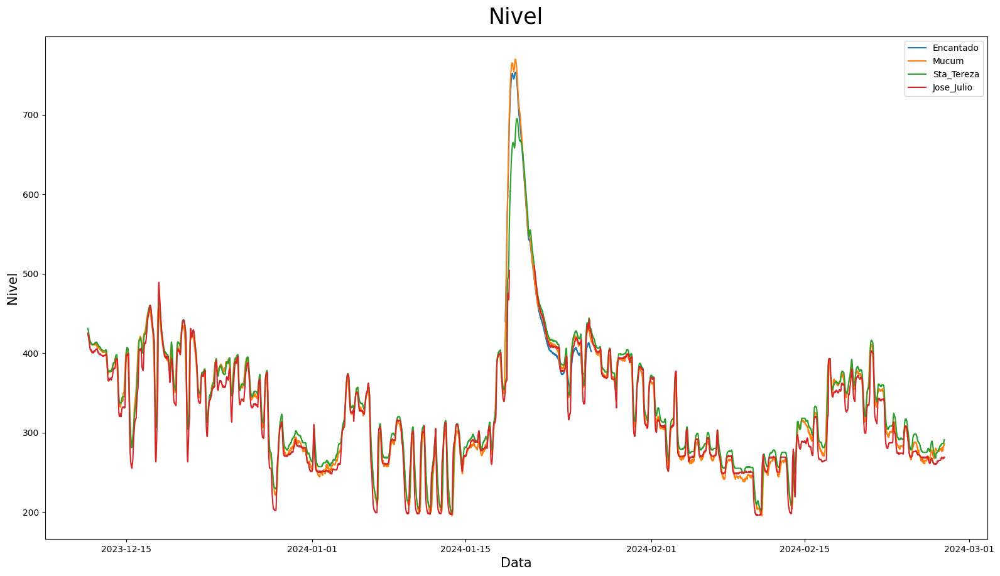

In [69]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-12-11 12:00')
data_fim = pd.to_datetime('2024-2-27 18:00')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

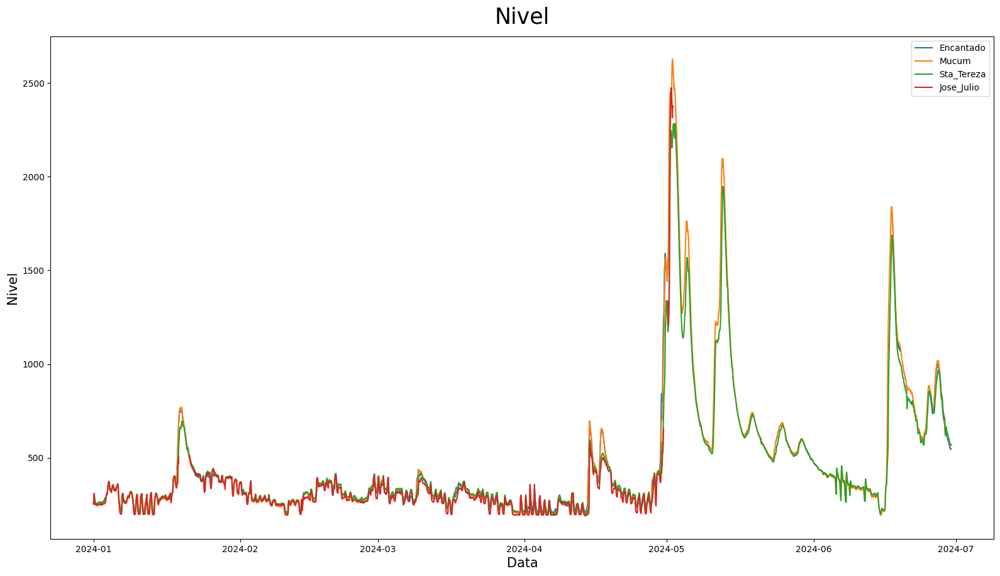

In [70]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-01-1')
data_fim = pd.to_datetime('2024-6-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

## Grafico pós tratamento de valores fora do padrão

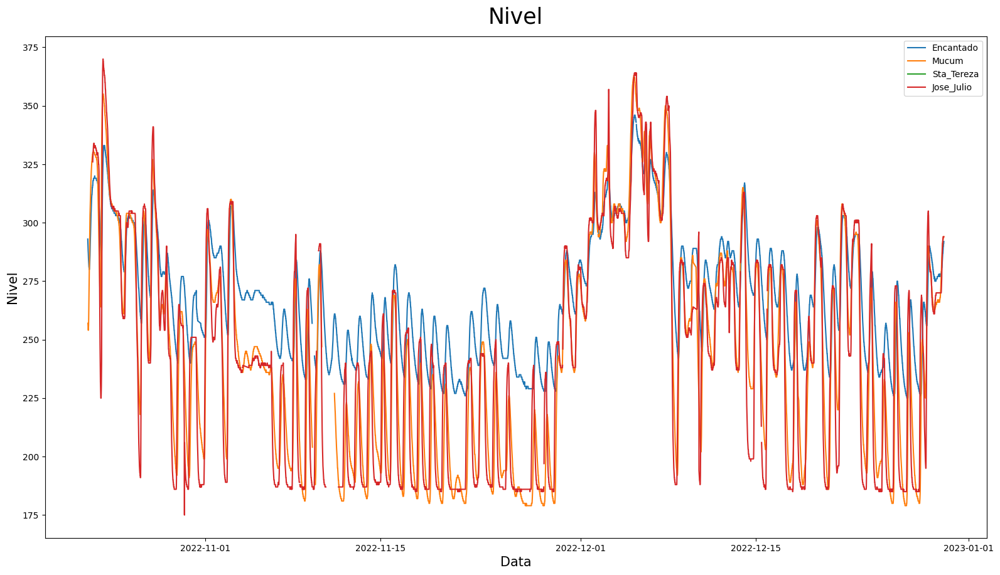

In [71]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-07-1')
data_fim = pd.to_datetime('2022-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

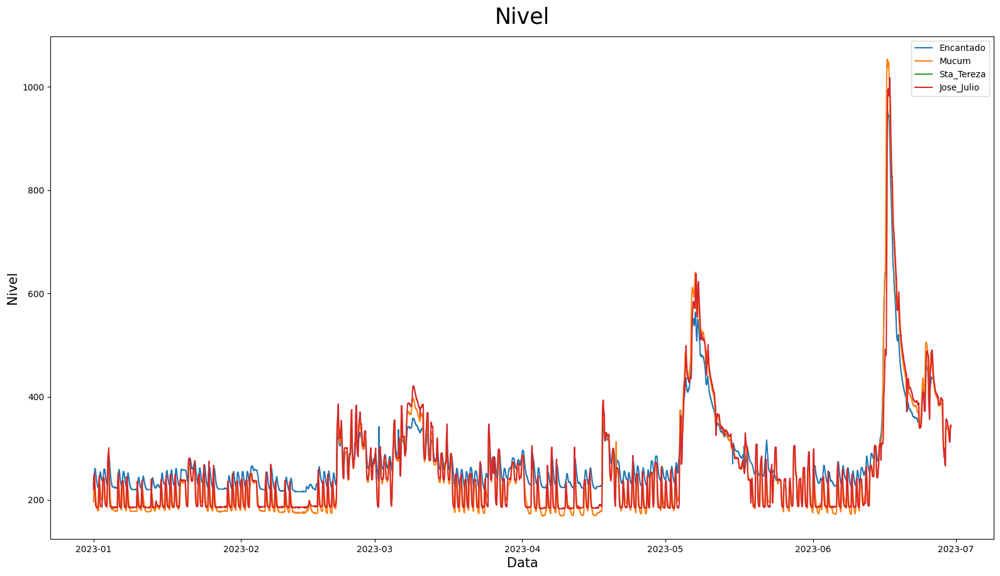

In [72]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-01-1')
data_fim = pd.to_datetime('2023-6-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

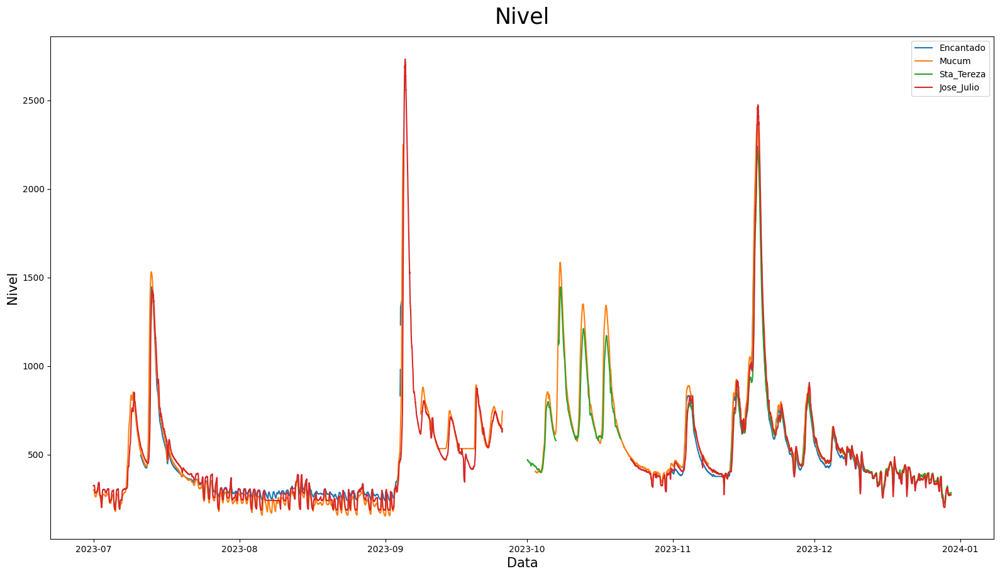

In [73]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-07-1')
data_fim = pd.to_datetime('2023-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

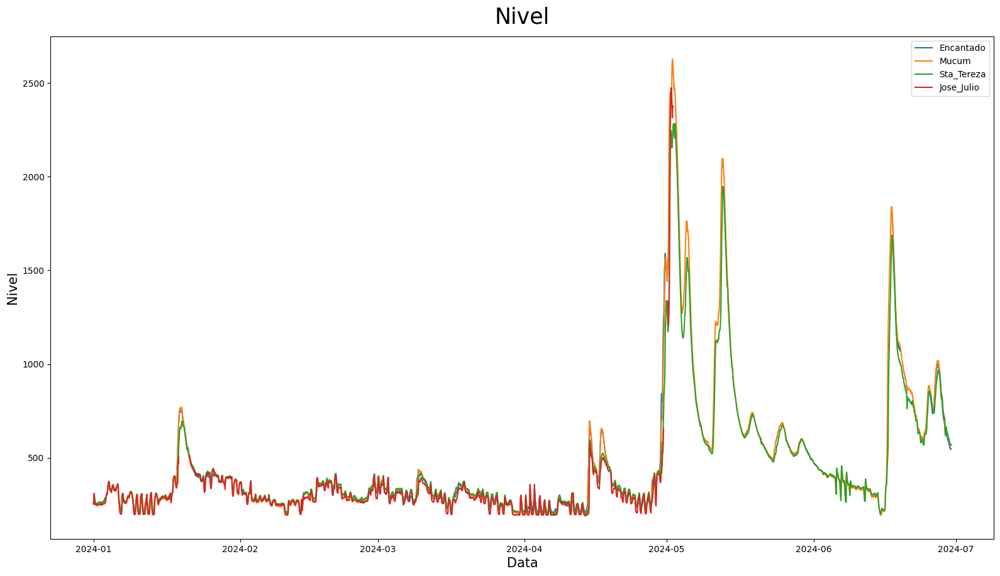

In [74]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-01-1')
data_fim = pd.to_datetime('2024-6-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

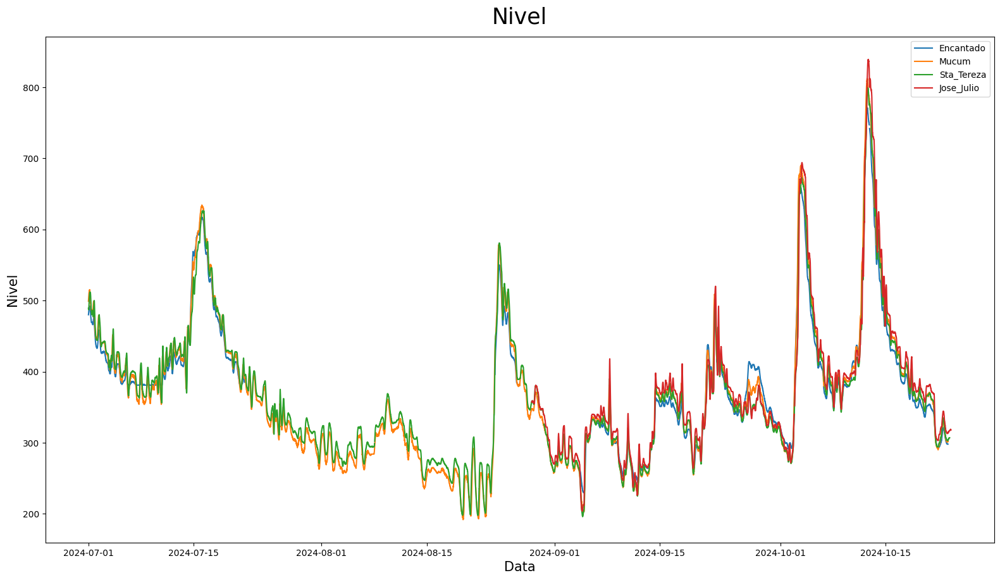

In [75]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2024-07-1')
data_fim = pd.to_datetime('2024-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [76]:
df_Encantado_unico.tail()

,Data/Hora,Chuva(mm),Nivel(cm),Vazao(m3/s)
64777,2022-10-22 16:15:00,0.0,287.0,177.5
64778,2022-10-22 16:00:00,0.0,288.0,180.8
64779,2022-10-22 15:45:00,0.0,290.0,187.5
64780,2022-10-22 15:30:00,0.0,291.0,190.8
64781,2022-10-22 15:15:00,0.0,293.0,197.6


In [77]:
df_Mucum_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69365 entries, 0 to 69364
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    69365 non-null  datetime64[ns]
 1   Chuva(mm)    69365 non-null  float64       
 2   Nivel(cm)    68861 non-null  float64       
 3   Vazao(m3/s)  69365 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.1 MB


## Media do Nivel da agua

- Pegando os quatro graficos famos fazer uma media dos valores do nivel da agua
- Utulizaremos esta media para preencher os valores nulos dos do nivel da agua

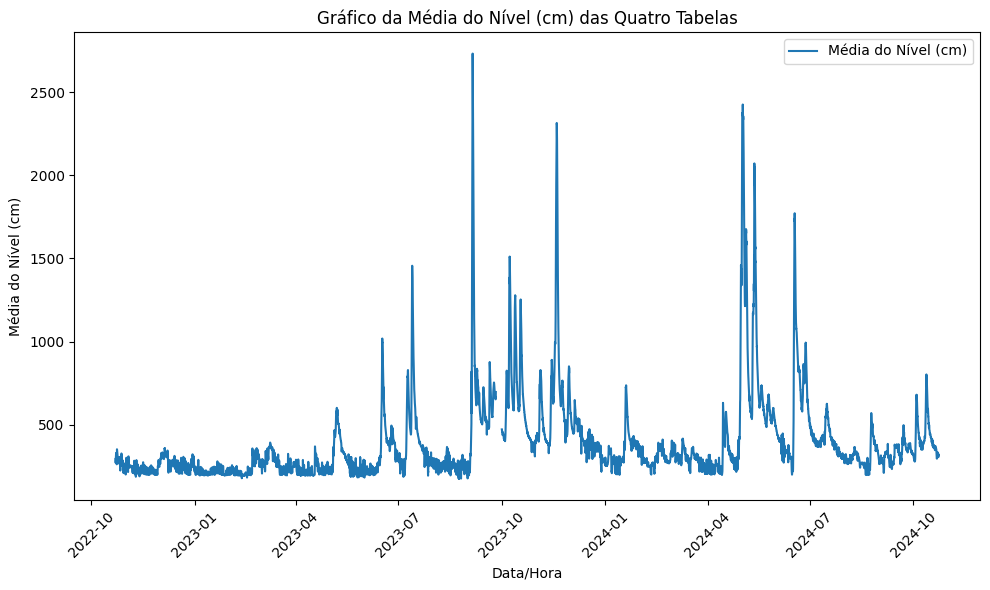

In [78]:
# Selecione apenas as colunas 'Data/Hora' e 'Nivel(cm)' de cada tabela
df1 = df_Encantado_unico[['Data/Hora', 'Nivel(cm)']]
df2 = df_Mucum_unico[['Data/Hora', 'Nivel(cm)']]
df3 = df_Sta_Tereza_unico[['Data/Hora', 'Nivel(cm)']]
df4 = df_Jose_Julio_unico[['Data/Hora', 'Nivel(cm)']]

# Renomeie a coluna 'Nivel(cm)' em cada DataFrame para identificá-los após o merge
df1 = df1.rename(columns={'Nivel(cm)': 'Nivel_1'})
df2 = df2.rename(columns={'Nivel(cm)': 'Nivel_2'})
df3 = df3.rename(columns={'Nivel(cm)': 'Nivel_3'})
df4 = df4.rename(columns={'Nivel(cm)': 'Nivel_4'})

# Combine as tabelas com base na coluna 'Data/Hora'
df_merged = pd.merge(df1, df2, on='Data/Hora', how='outer')
df_merged = pd.merge(df_merged, df3, on='Data/Hora', how='outer')
df_merged = pd.merge(df_merged, df4, on='Data/Hora', how='outer')

# Calcule a média dos valores de 'Nivel(cm)' ignorando valores nulos
df_merged['Nivel(cm)'] = df_merged[['Nivel_1', 'Nivel_2', 'Nivel_3', 'Nivel_4']].mean(axis=1)

# Plote o gráfico da média
plt.figure(figsize=(10, 6))
plt.plot(df_merged['Data/Hora'], df_merged['Nivel(cm)'], label='Média do Nível (cm)')
plt.xlabel('Data/Hora')
plt.ylabel('Média do Nível (cm)')
plt.title('Gráfico da Média do Nível (cm) das Quatro Tabelas')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [79]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Data/Hora  69994 non-null  datetime64[ns]
 1   Nivel_1    44877 non-null  float64       
 2   Nivel_2    68861 non-null  float64       
 3   Nivel_3    35177 non-null  float64       
 4   Nivel_4    55363 non-null  float64       
 5   Nivel(cm)  69726 non-null  float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 3.2 MB


In [80]:
df_merged.head()

,Data/Hora,Nivel_1,Nivel_2,Nivel_3,Nivel_4,Nivel(cm)
0,2022-10-22 15:15:00,293.0,NaN,NaN,NaN,293.0
1,2022-10-22 15:30:00,291.0,257.0,NaN,NaN,274.0
2,2022-10-22 15:45:00,290.0,256.0,NaN,NaN,273.0
3,2022-10-22 16:00:00,288.0,255.0,NaN,NaN,271.5
4,2022-10-22 16:15:00,287.0,254.0,NaN,NaN,270.5


In [81]:
df_merged.tail()

,Data/Hora,Nivel_1,Nivel_2,Nivel_3,Nivel_4,Nivel(cm)
69989,2024-10-23 15:30:00,NaN,NaN,NaN,318.0,318.0
69990,2024-10-23 15:45:00,NaN,NaN,NaN,318.0,318.0
69991,2024-10-23 16:00:00,NaN,NaN,NaN,318.0,318.0
69992,2024-10-23 16:15:00,NaN,NaN,NaN,318.0,318.0
69993,2024-10-23 16:30:00,NaN,NaN,NaN,318.0,318.0


Grafico da 4 cidades com valores nulos

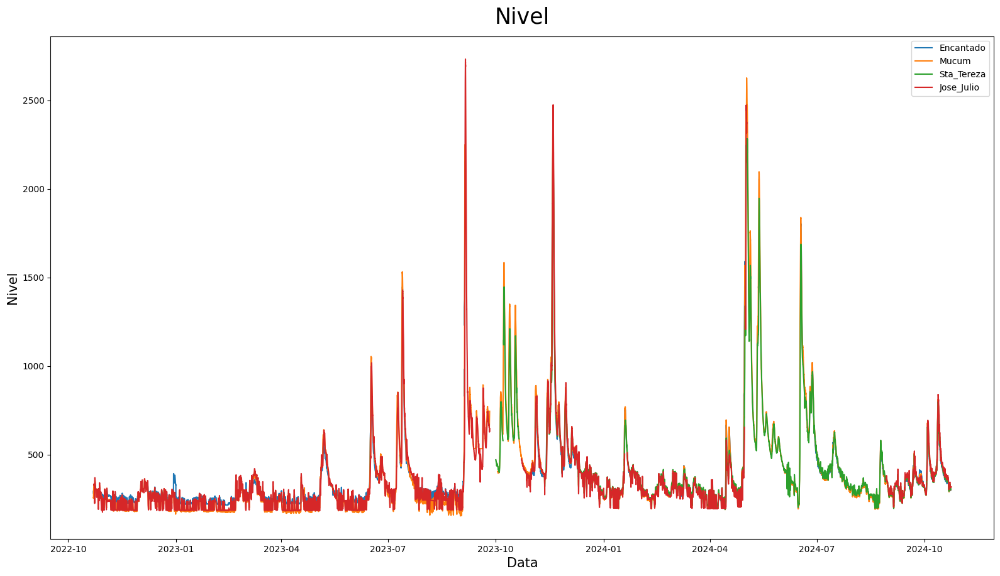

In [82]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-07-1')
data_fim = pd.to_datetime('2024-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [83]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Data/Hora  69994 non-null  datetime64[ns]
 1   Nivel_1    44877 non-null  float64       
 2   Nivel_2    68861 non-null  float64       
 3   Nivel_3    35177 non-null  float64       
 4   Nivel_4    55363 non-null  float64       
 5   Nivel(cm)  69726 non-null  float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 3.2 MB


Remover valores que usamos para media deixando apenas o que iremos utilizar

In [84]:
# Excluir as colunas Nivel_1, Nivel_2, Nivel_3 e Nivel_4
df_merged = df_merged.drop(columns=['Nivel_1', 'Nivel_2', 'Nivel_3', 'Nivel_4'])

# Exibir informações do DataFrame após a exclusão
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Data/Hora  69994 non-null  datetime64[ns]
 1   Nivel(cm)  69726 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.1 MB


Interpolar os valores que faltaram pois em um pequeno intervalo de tempo as 4 estaçoes estavam inoperantes

In [85]:
# Interpolar os valores nulos na coluna 'Nivel(cm)'
df_merged['Nivel(cm)'] = df_merged['Nivel(cm)'].interpolate()

# Remover todas as linhas que contenham valores nulos
df_merged = df_merged.dropna()

# Exibir informações do DataFrame após a interpolação e remoção
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Data/Hora  69994 non-null  datetime64[ns]
 1   Nivel(cm)  69994 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.1 MB


Grafico da média do Nivel da agua das 4 estaçoes

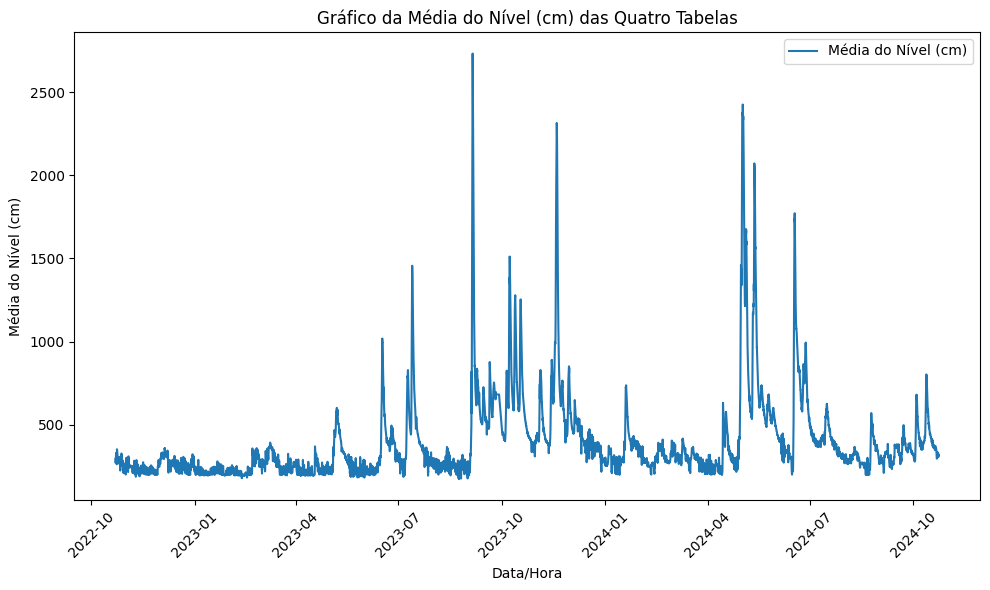

In [86]:
# Plote o gráfico da média
plt.figure(figsize=(10, 6))
plt.plot(df_merged['Data/Hora'], df_merged['Nivel(cm)'], label='Média do Nível (cm)')
plt.xlabel('Data/Hora')
plt.ylabel('Média do Nível (cm)')
plt.title('Gráfico da Média do Nível (cm) das Quatro Tabelas')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [87]:
def plotar_matplot(titulo, labelx, labely, x, y, dataset):
  fig = plt.figure(figsize=(15,8))
  eixo = fig.add_axes([0,0,1,1])
  eixo.plot(x, y, data = dataset, marker='o', linestyle='-')  # 'o-' combina linha com pontos nas marcações
  eixo.set_title(titulo, fontsize=25, pad=15)
  eixo.set_xlabel(labelx, fontsize=15)
  eixo.set_ylabel(labely, fontsize=15)
  eixo = eixo

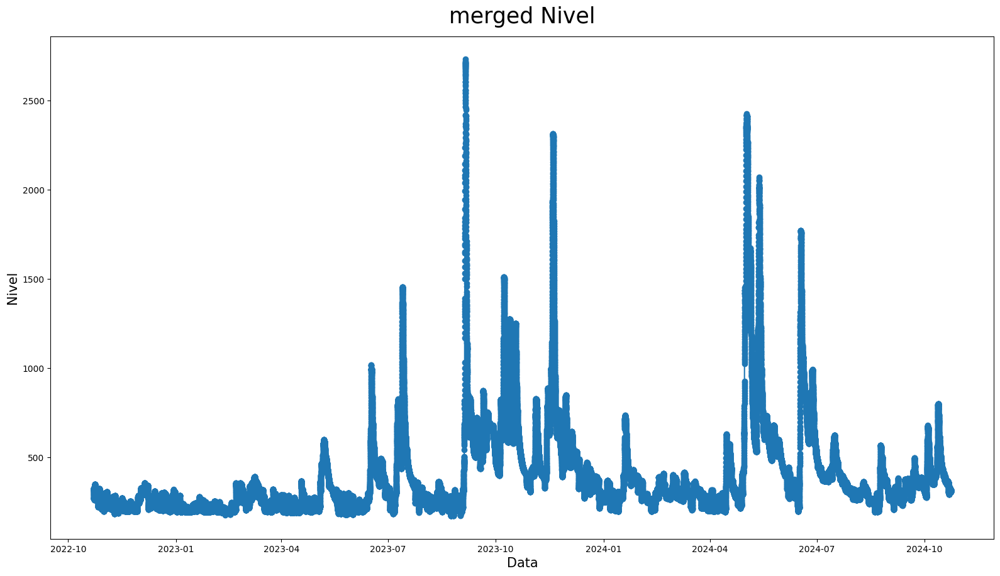

In [88]:
plotar_matplot('merged Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_merged)

Grafico de uma das estaçoes para comparação posterior

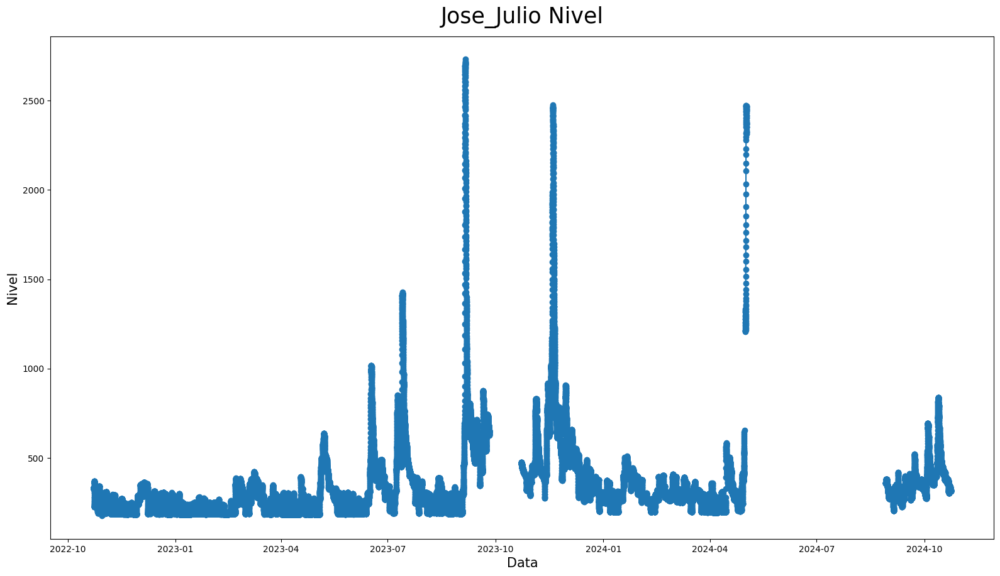

In [89]:
plotar_matplot('Jose_Julio Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Jose_Julio_unico)

Foi notado que alem de valores nulos há datas faltantes no intervalo de tempo de 2 anos
- Necessario criar linhas de datas faltantes

In [90]:
# Criar um DataFrame com todas as datas de df_merged
df_todas_as_datas = pd.DataFrame({'Data/Hora': df_merged['Data/Hora'].unique()})

# Realizar o merge entre df_todas_as_datas e df_Encantado_unico
df_Encantado_unico = pd.merge(df_todas_as_datas, df_Encantado_unico, on='Data/Hora', how='left')

# Preencher os valores da coluna 'Nivel(cm)' com base em df_merged
df_Encantado_unico['Nivel(cm)'] = df_Encantado_unico['Nivel(cm)'].fillna(
    df_merged.set_index('Data/Hora')['Nivel(cm)']
)


In [91]:
# Criar um DataFrame com todas as datas de df_merged
df_todas_as_datas = pd.DataFrame({'Data/Hora': df_merged['Data/Hora'].unique()})

# Realizar o merge entre df_todas_as_datas e df_Mucum_unico
df_Mucum_unico = pd.merge(df_todas_as_datas, df_Mucum_unico, on='Data/Hora', how='left')

# Preencher os valores da coluna 'Nivel(cm)' com base em df_merged
df_Mucum_unico['Nivel(cm)'] = df_Mucum_unico['Nivel(cm)'].fillna(
    df_merged.set_index('Data/Hora')['Nivel(cm)']
)


In [92]:
# Criar um DataFrame com todas as datas de df_merged
df_todas_as_datas = pd.DataFrame({'Data/Hora': df_merged['Data/Hora'].unique()})

# Realizar o merge entre df_todas_as_datas e df_Sta_Tereza_unico
df_Sta_Tereza_unico = pd.merge(df_todas_as_datas, df_Sta_Tereza_unico, on='Data/Hora', how='left')

# Preencher os valores da coluna 'Nivel(cm)' com base em df_merged
df_Sta_Tereza_unico['Nivel(cm)'] = df_Sta_Tereza_unico['Nivel(cm)'].fillna(
    df_merged.set_index('Data/Hora')['Nivel(cm)']
)



In [93]:
# Criar um DataFrame com todas as datas de df_merged
df_todas_as_datas = pd.DataFrame({'Data/Hora': df_merged['Data/Hora'].unique()})

# Realizar o merge entre df_todas_as_datas e df_Jose_Julio_unico
df_Jose_Julio_unico = pd.merge(df_todas_as_datas, df_Jose_Julio_unico, on='Data/Hora', how='left')

# Preencher os valores da coluna 'Nivel(cm)' com base em df_merged
df_Jose_Julio_unico['Nivel(cm)'] = df_Jose_Julio_unico['Nivel(cm)'].fillna(
    df_merged.set_index('Data/Hora')['Nivel(cm)']
)



Para os valores de Nivel faltantes (Nulos), foram preenchidos com o valor medio do nivel da agua das estaçoes restantes

In [94]:
# Para cada tabela, preencha os valores nulos em 'Nivel(cm)' com base na tabela df_merged
for tabela in [df_Encantado_unico,df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico]:
    # Realizar o merge com base na coluna 'Data/Hora'
    tabela_merged = pd.merge(tabela, df_merged[['Data/Hora', 'Nivel(cm)']], on='Data/Hora', how='left', suffixes=('', '_from_merged'))

    # Preencher os valores nulos na coluna 'Nivel(cm)' com os valores da coluna 'Nivel(cm)' da tabela df_merged
    tabela['Nivel(cm)'] = tabela_merged['Nivel(cm)'].fillna(tabela_merged['Nivel(cm)_from_merged'])

In [95]:
# Verificar quais linhas têm valores nulos na coluna 'Nivel(cm)' de df_Jose_Julio_unico
mask_nulos = df_Jose_Julio_unico['Nivel(cm)'].isnull()

# Para cada data onde 'Nivel(cm)' é nulo, buscar o valor correspondente em df_merged
for index, row in df_Jose_Julio_unico[mask_nulos].iterrows():
    data = row['Data/Hora']
    # Verificar se a data existe em df_merged
    valor_novo = df_merged.loc[df_merged['Data/Hora'] == data, 'Nivel(cm)']

    if not valor_novo.empty:
        # Substituir o valor nulo pela nova informação
        df_Jose_Julio_unico.at[index, 'Nivel(cm)'] = valor_novo.values[0]

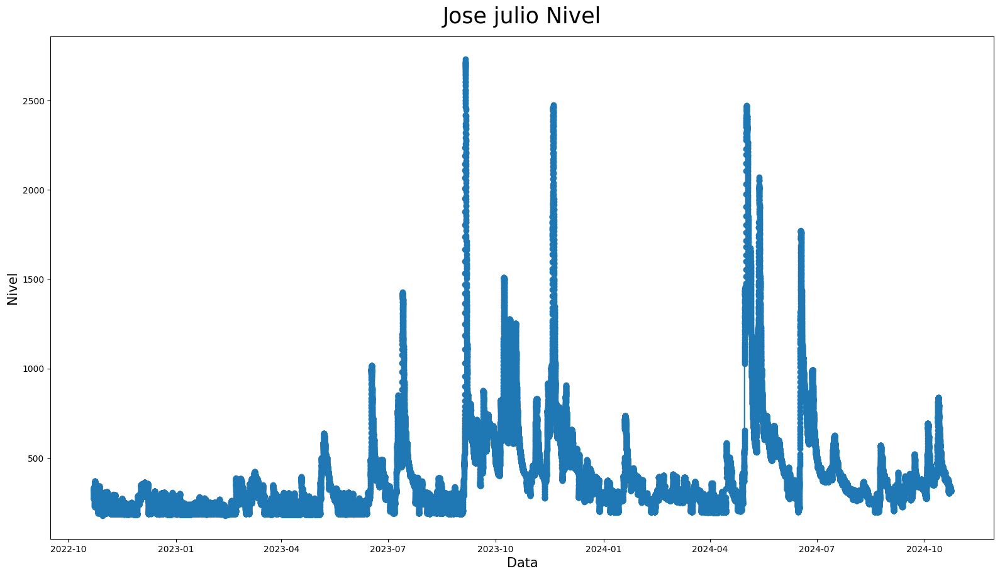

In [96]:
plotar_matplot('Jose julio Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Jose_Julio_unico)

Grafico das 4 estaçoes com o nivel da agua sem nenhum valor nulo

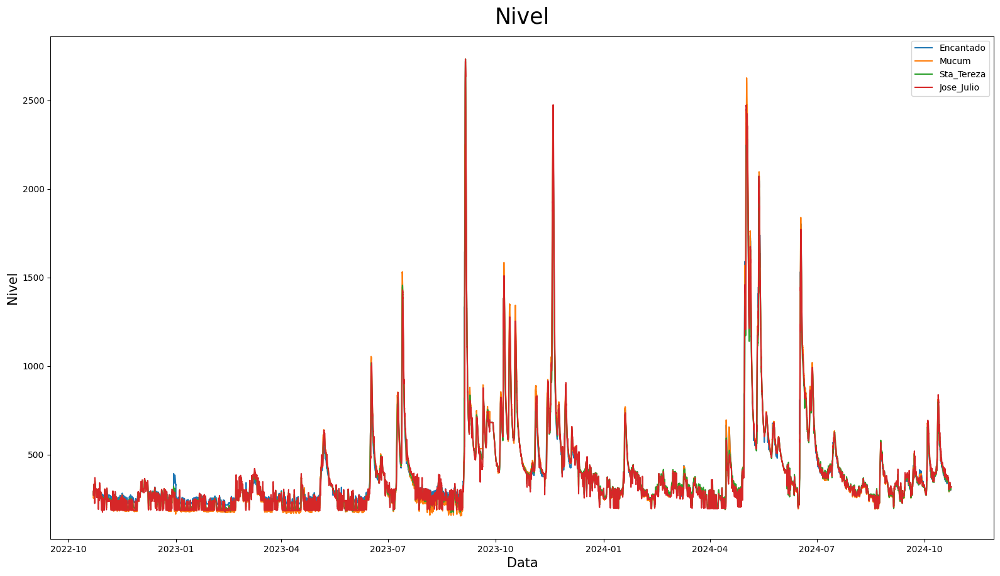

In [97]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-07-1')
data_fim = pd.to_datetime('2024-12-30')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

As datas faltantes nos intervalos possuem os Niveis preenchidos pela media mas os valores da chuva e vazão são nulos pois não tinha dados neste intervalo

In [98]:
df_Encantado_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    69994 non-null  datetime64[ns]
 1   Chuva(mm)    64782 non-null  float64       
 2   Nivel(cm)    69994 non-null  float64       
 3   Vazao(m3/s)  64782 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.1 MB


In [99]:
df_Mucum_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    69994 non-null  datetime64[ns]
 1   Chuva(mm)    69365 non-null  float64       
 2   Nivel(cm)    69994 non-null  float64       
 3   Vazao(m3/s)  69365 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.1 MB


In [100]:
df_Sta_Tereza_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    69994 non-null  datetime64[ns]
 1   Chuva(mm)    36971 non-null  float64       
 2   Nivel(cm)    69994 non-null  float64       
 3   Vazao(m3/s)  0 non-null      float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.1 MB


In [101]:
df_Jose_Julio_unico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69994 entries, 0 to 69993
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Data/Hora    69994 non-null  datetime64[ns]
 1   Chuva(mm)    67257 non-null  float64       
 2   Nivel(cm)    69994 non-null  float64       
 3   Vazao(m3/s)  67257 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.1 MB


foi necessario fazer mesma interpolação feita anteriormente para os valores da chuva e vazão para as novas linhas criadas

In [102]:
df_Encantado_unico['Chuva(mm)'] = df_Encantado_unico['Chuva(mm)'].fillna(0)
df_Mucum_unico['Chuva(mm)'] = df_Mucum_unico['Chuva(mm)'].fillna(0)
df_Sta_Tereza_unico['Chuva(mm)'] = df_Sta_Tereza_unico['Chuva(mm)'].fillna(0)
df_Jose_Julio_unico['Chuva(mm)'] = df_Jose_Julio_unico['Chuva(mm)'].fillna(0)
df_Encantado_unico['Vazao(m3/s)'] = df_Encantado_unico['Vazao(m3/s)'].interpolate(method='linear')
df_Mucum_unico['Vazao(m3/s)'] = df_Mucum_unico['Vazao(m3/s)'].interpolate(method='linear')
df_Sta_Tereza_unico['Vazao(m3/s)'] = df_Sta_Tereza_unico['Vazao(m3/s)'].interpolate(method='linear')
df_Jose_Julio_unico['Vazao(m3/s)'] = df_Jose_Julio_unico['Vazao(m3/s)'].interpolate(method='linear')

## SHIFT BACK

- para os dados Voltarem em suas posiçoes originais é necessario fazer o deslocamento feito anteriormente com os valores opostos pondo os valores no seu ponto original

In [103]:
# Definir os deslocamentos específicos para cada tabela
shift1, shift2, shift3, shift4 = 12, 12, -7, -20

# Alinhar as tabelas
df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico = deslocar_data_series(
    df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
    coluna_data='Data/Hora',
    shift1=shift1, shift2=shift2, shift3=shift3, shift4=shift4
)

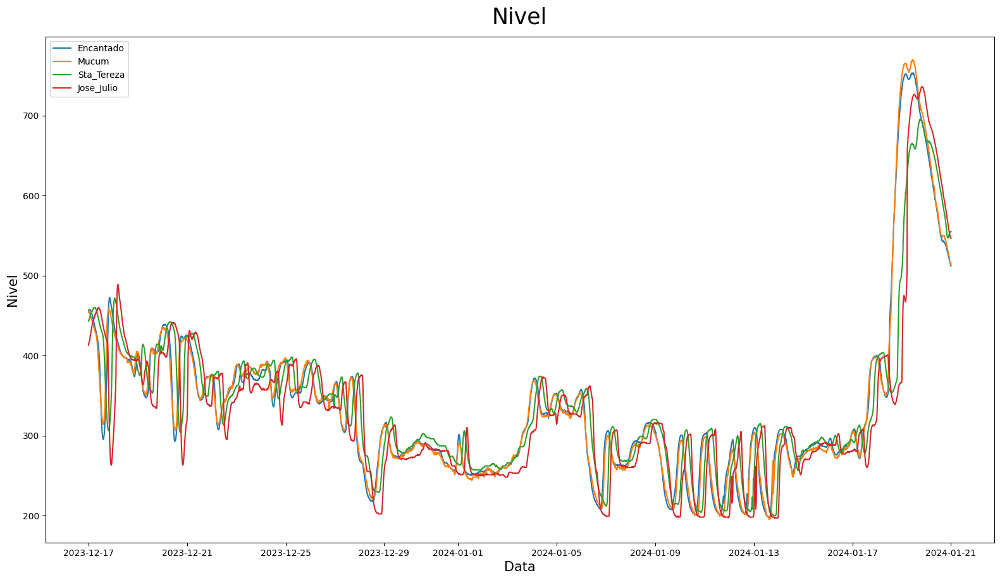

In [104]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-12-17')
data_fim = pd.to_datetime('2024-01-21')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

In [105]:
df_Encantado_unico['Nivel(cm)'] = df_Encantado_unico['Nivel(cm)'] - 180
df_Mucum_unico['Nivel(cm)'] = df_Mucum_unico['Nivel(cm)'] - 70
df_Sta_Tereza_unico['Nivel(cm)'] = df_Sta_Tereza_unico['Nivel(cm)'] - 50
df_Jose_Julio_unico['Nivel(cm)'] = df_Jose_Julio_unico['Nivel(cm)'] + 40

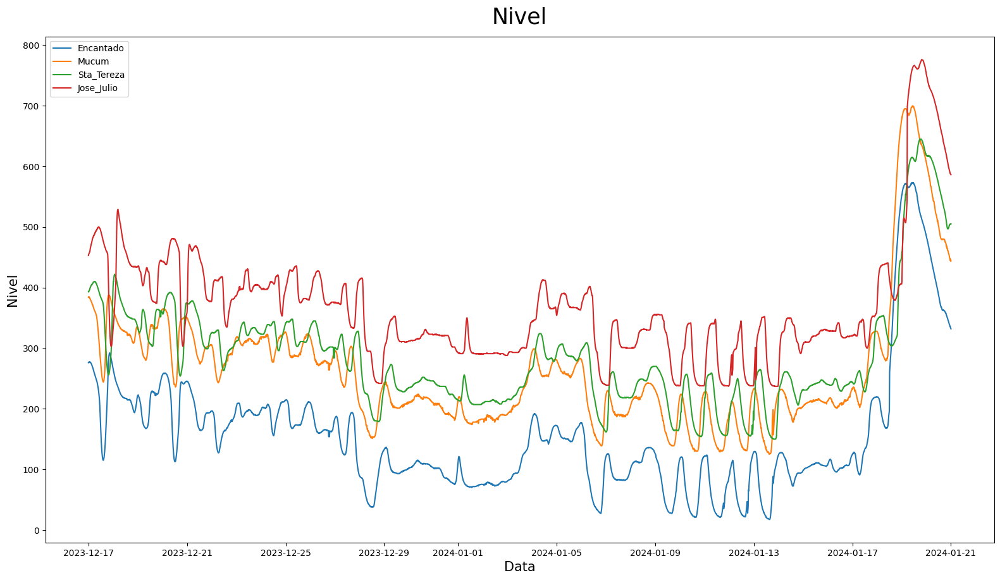

In [106]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-12-17')
data_fim = pd.to_datetime('2024-01-21')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

# Plotando graficos Nivel (ano)




Graficos do nivel de cada cidade dos valores não tratados separado por ano

In [107]:
def plotar_matplot(titulo, labelx, labely, x, y, dataset):
  fig = plt.figure(figsize=(15,8))
  eixo = fig.add_axes([0,0,1,1])
  eixo.plot(x, y, data = dataset, marker='o', linestyle='-')  # 'o-' combina linha com pontos nas marcações
  eixo.set_title(titulo, fontsize=25, pad=15)
  eixo.set_xlabel(labelx, fontsize=15)
  eixo.set_ylabel(labely, fontsize=15)
  eixo = eixo

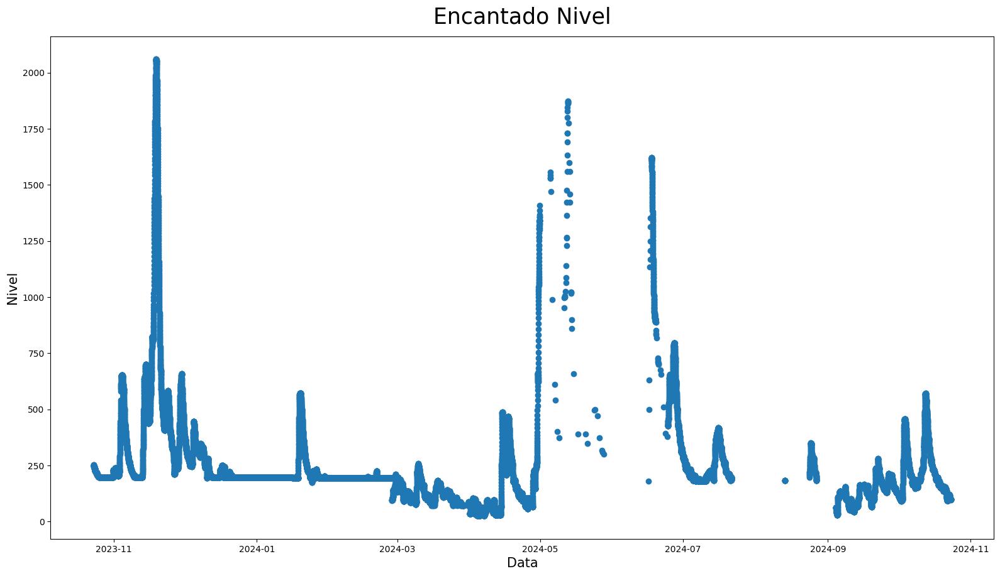

In [108]:
plotar_matplot('Encantado Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Encantado24)

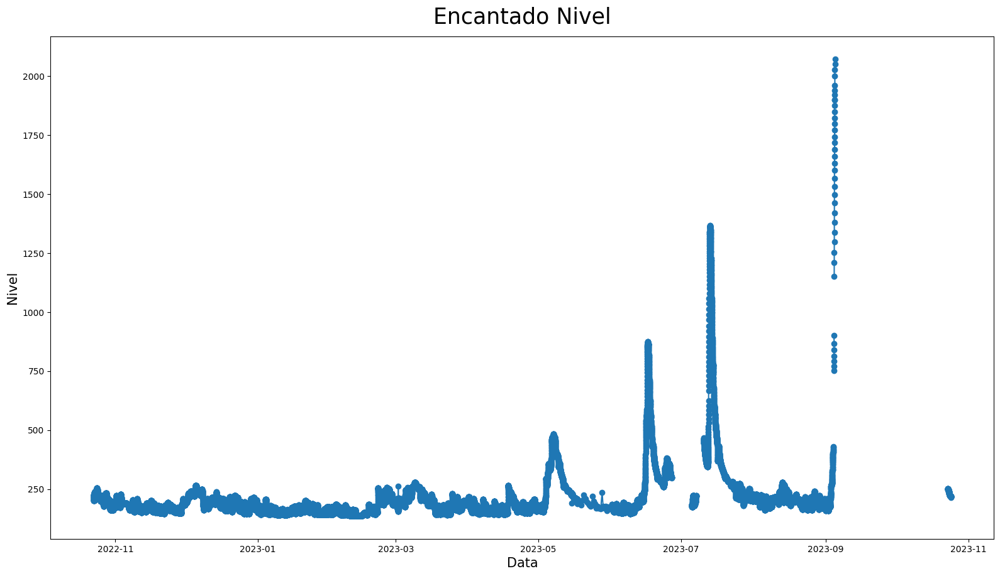

In [109]:
plotar_matplot('Encantado Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Encantado23)

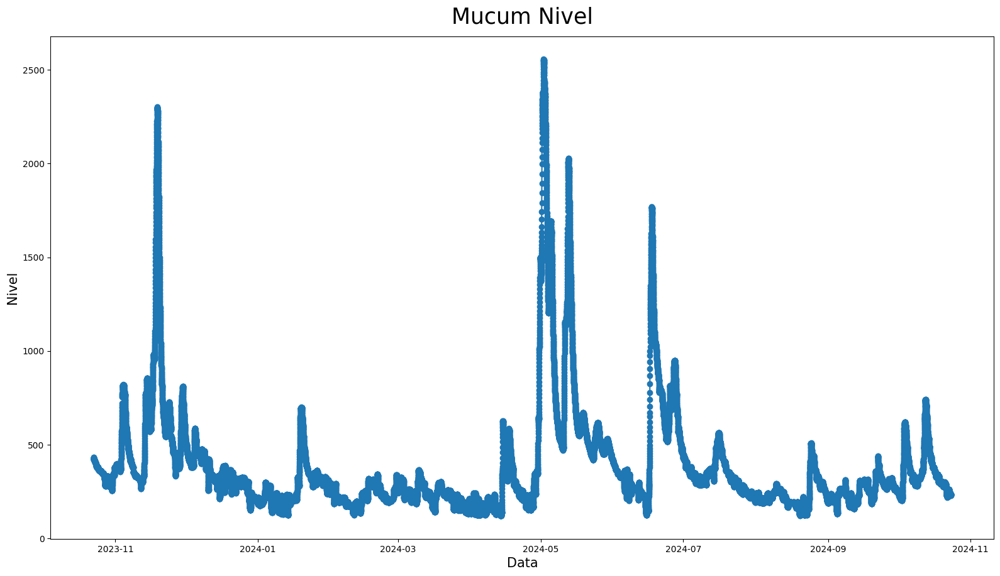

In [110]:
plotar_matplot('Mucum Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Mucum24)

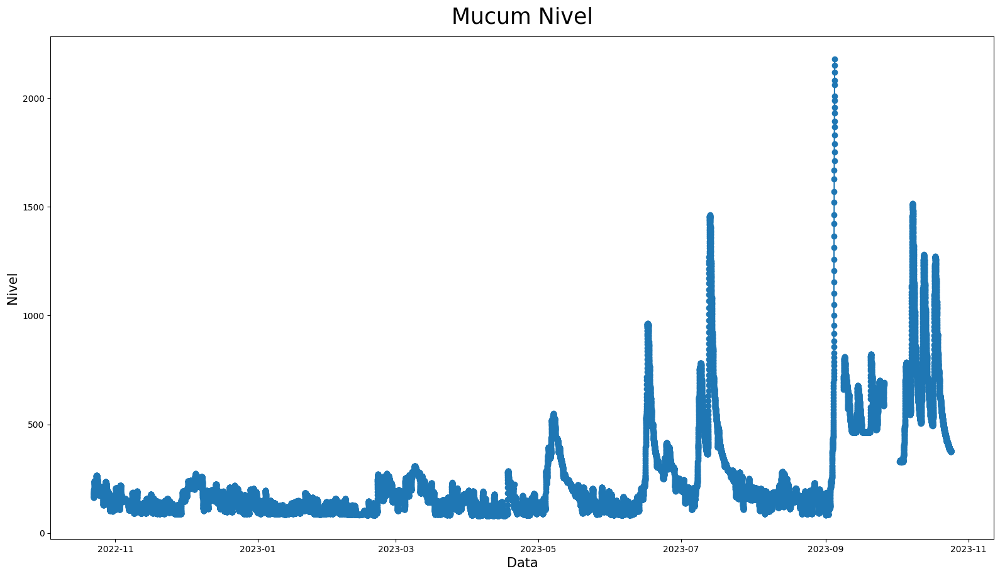

In [111]:
plotar_matplot('Mucum Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Mucum23)

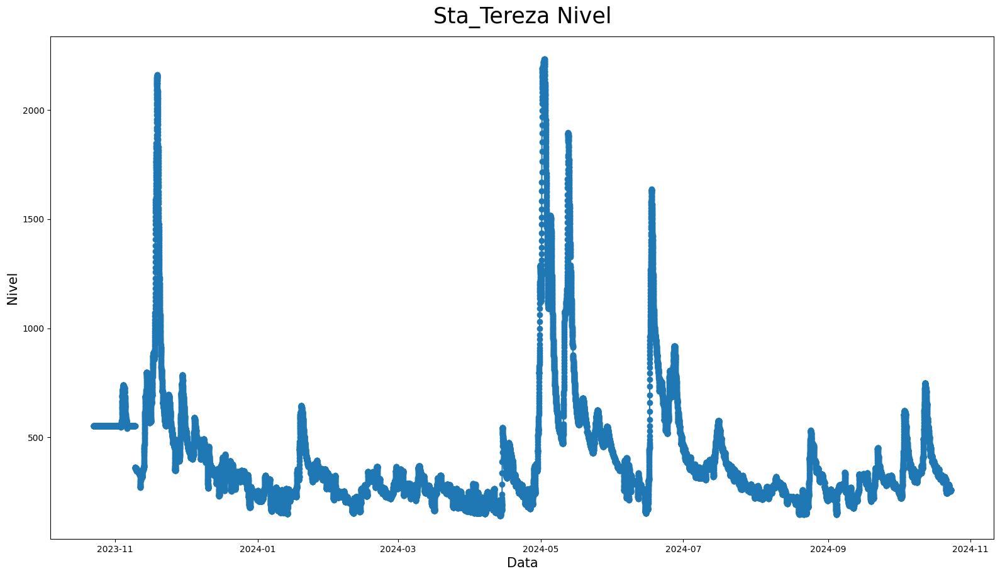

In [112]:
plotar_matplot('Sta_Tereza Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Sta_Tereza24)

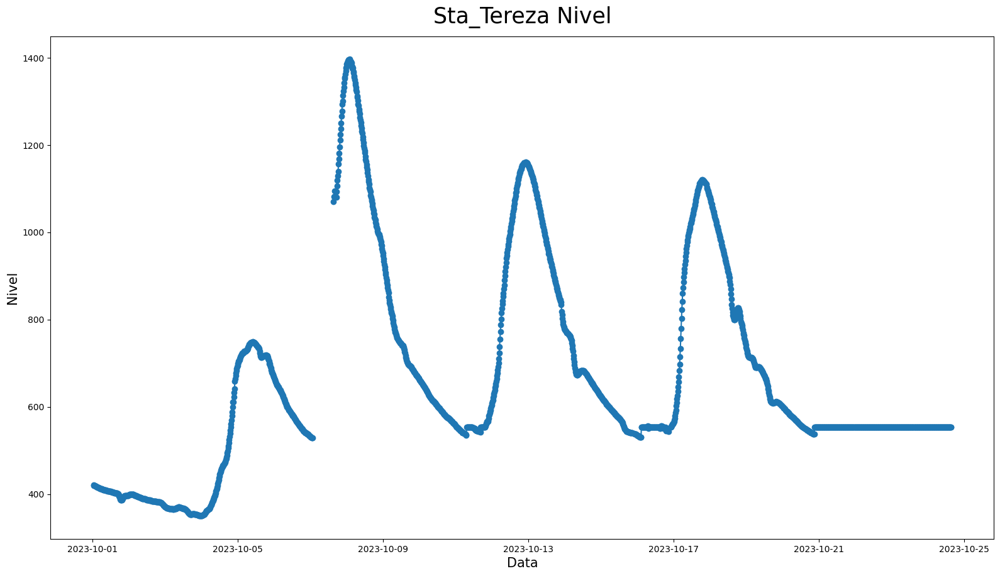

In [113]:
plotar_matplot('Sta_Tereza Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Sta_Tereza23)

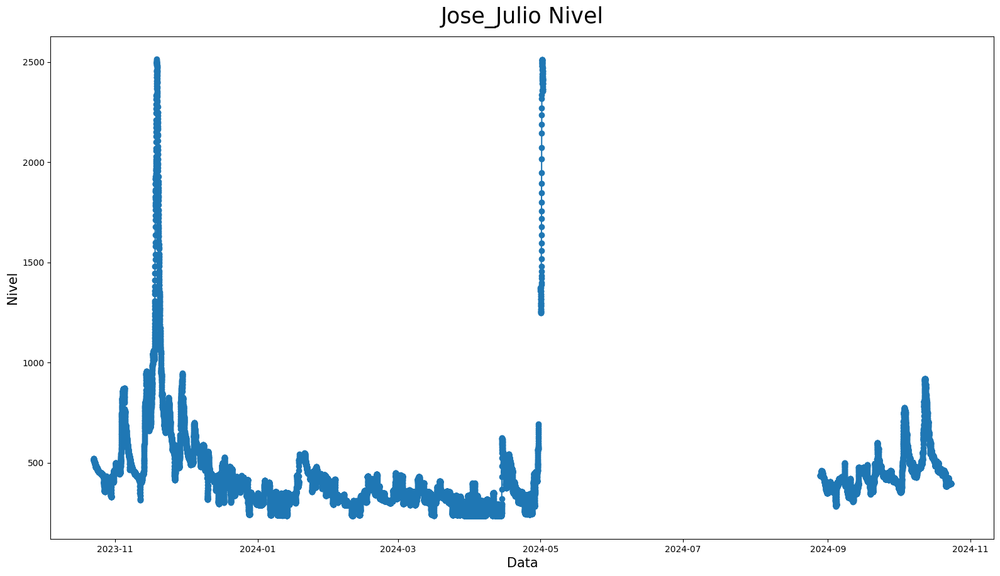

In [114]:
plotar_matplot('Jose_Julio Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Jose_Julio24)

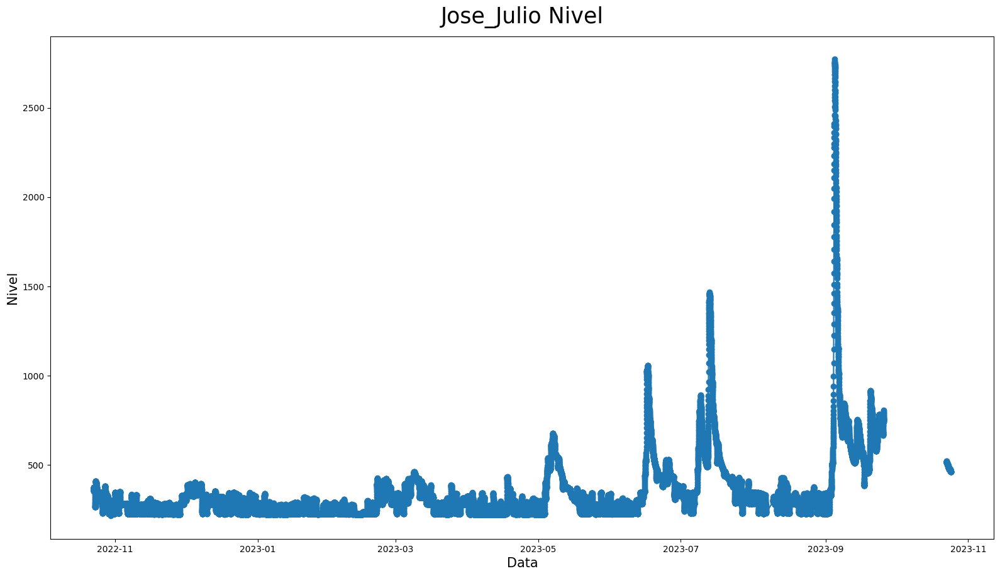

In [115]:
plotar_matplot('Jose_Julio Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Jose_Julio23)

# Boxplot

In [116]:
def plotar_matplot(titulo, labelx, labely, x, y, dataset, tipo='linha'):
    # Verificar se o dataset não está vazio
    if dataset.empty:
        print("O dataset está vazio.")
        return

    # Verificar se as colunas especificadas existem no dataset
    if x not in dataset.columns or y not in dataset.columns:
        print(f"As colunas '{x}' e '{y}' devem existir no dataset.")
        return

    fig = plt.figure(figsize=(15, 8))
    eixo = fig.add_axes([0, 0, 1, 1])

    if tipo == 'linha':
        eixo.plot(dataset[x], dataset[y], marker='o', linestyle='-')  # Gráfico de linha com pontos
    elif tipo == 'boxplot':
        # Remover nulos apenas da coluna y
        dataset_cleaned = dataset.dropna(subset=[y])
        eixo.boxplot(dataset_cleaned[y], vert=True)
        eixo.set_xticklabels([labelx])  # Rótulo do eixo x

    # Configurar título e rótulos dos eixos
    eixo.set_title(titulo, fontsize=25, pad=15)
    eixo.set_xlabel(labelx, fontsize=15)
    eixo.set_ylabel(labely, fontsize=15)

    plt.show()


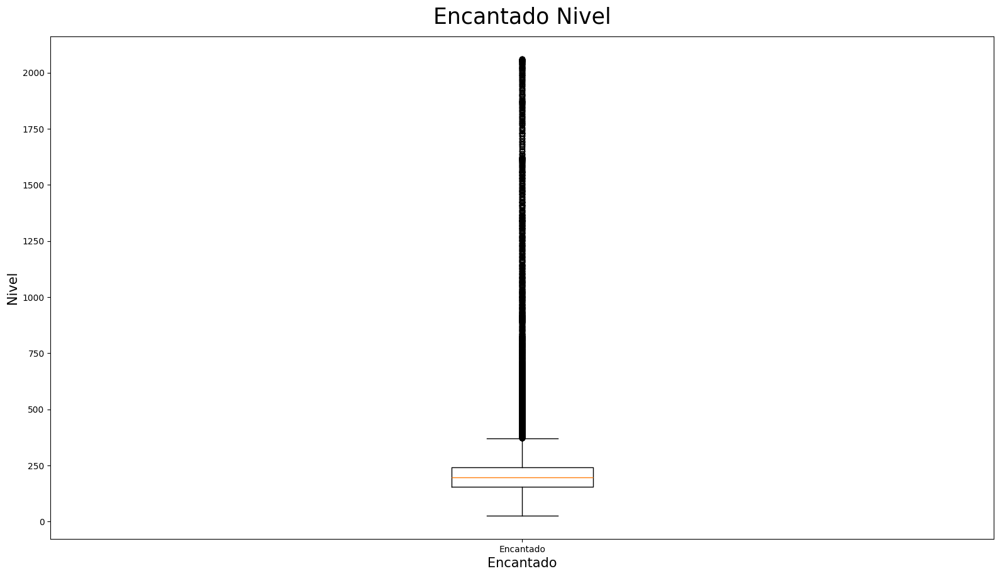

In [117]:
plotar_matplot('Encantado Nivel', 'Encantado', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Encantado24, tipo='boxplot')

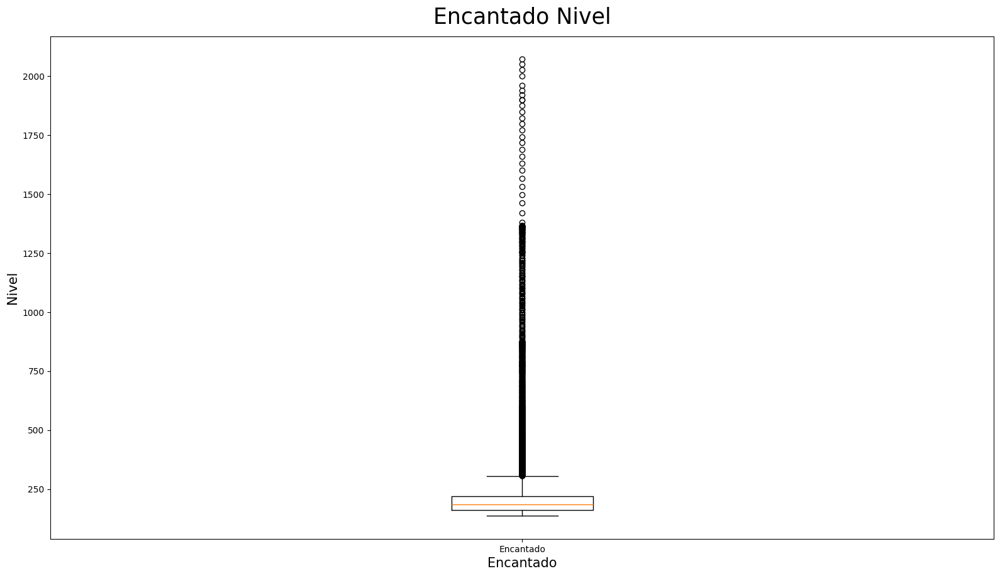

In [118]:
plotar_matplot('Encantado Nivel', 'Encantado', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Encantado23, tipo='boxplot')

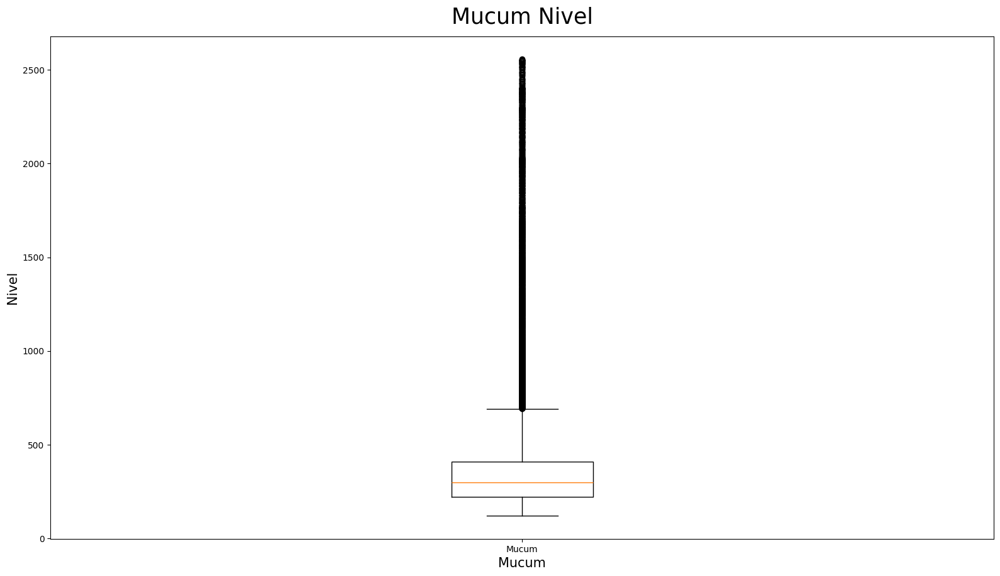

In [119]:
plotar_matplot('Mucum Nivel', 'Mucum', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Mucum24, tipo='boxplot')

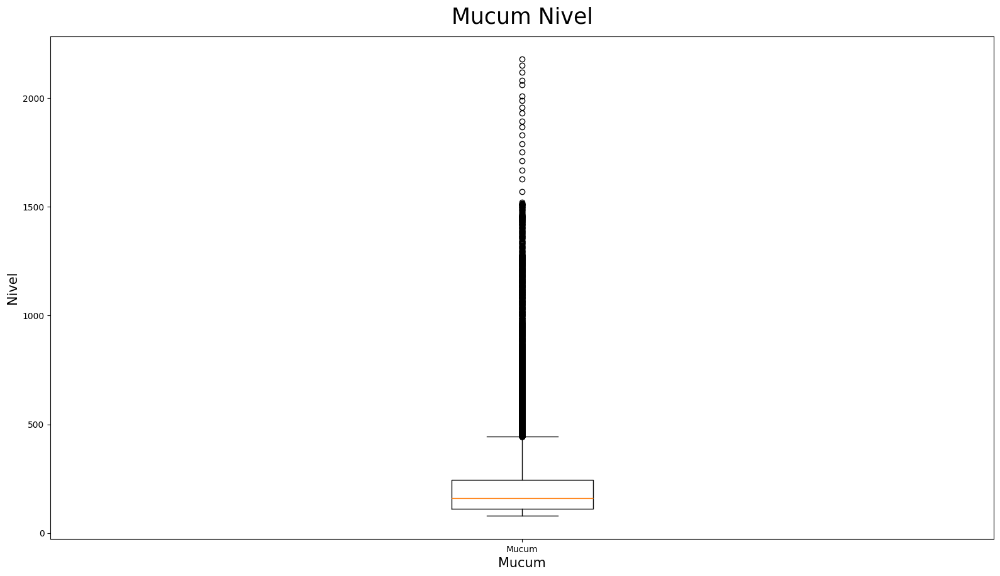

In [120]:
plotar_matplot('Mucum Nivel', 'Mucum', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Mucum23, tipo='boxplot')

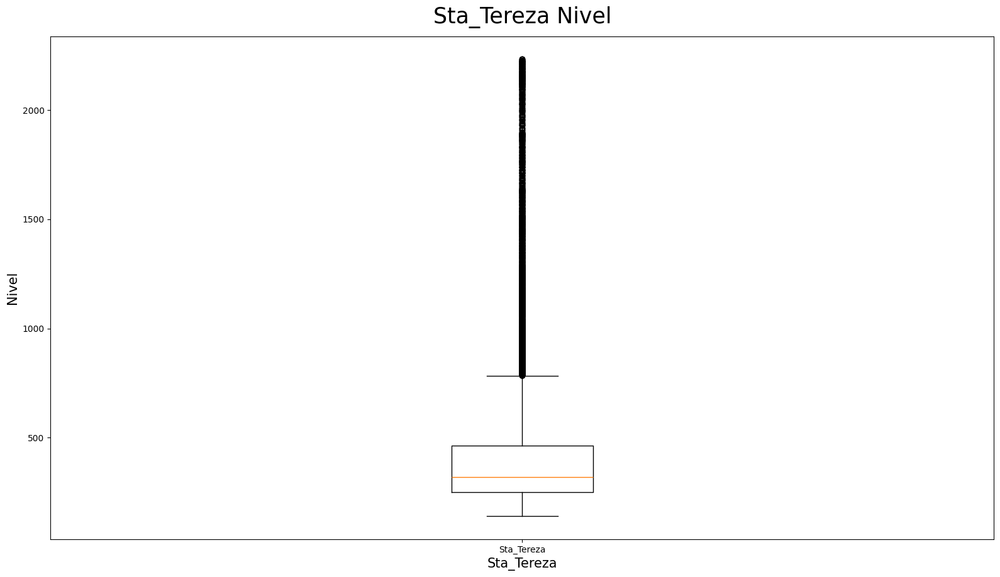

In [121]:
plotar_matplot('Sta_Tereza Nivel', 'Sta_Tereza', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Sta_Tereza24, tipo='boxplot')

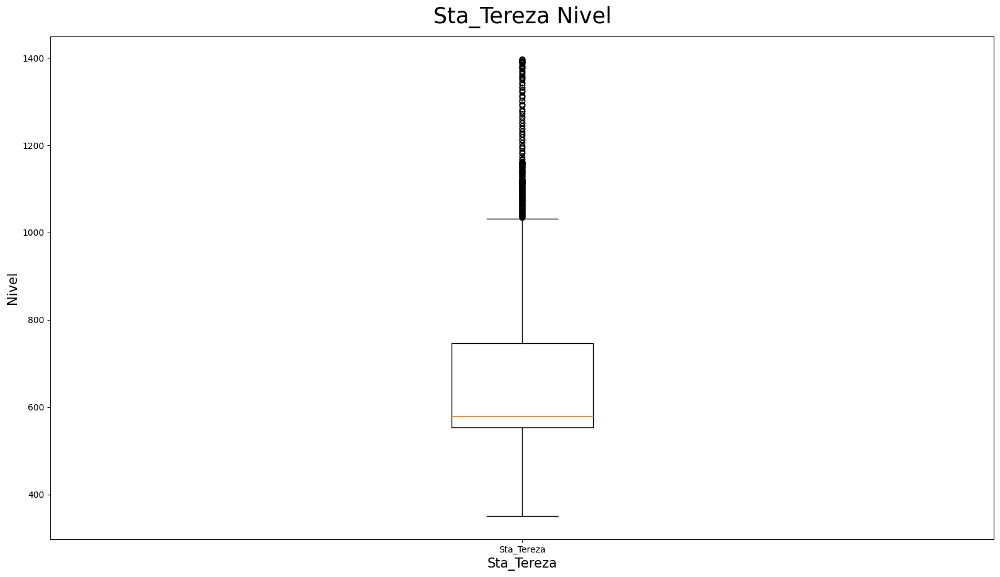

In [122]:
plotar_matplot('Sta_Tereza Nivel', 'Sta_Tereza', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Sta_Tereza23, tipo='boxplot')

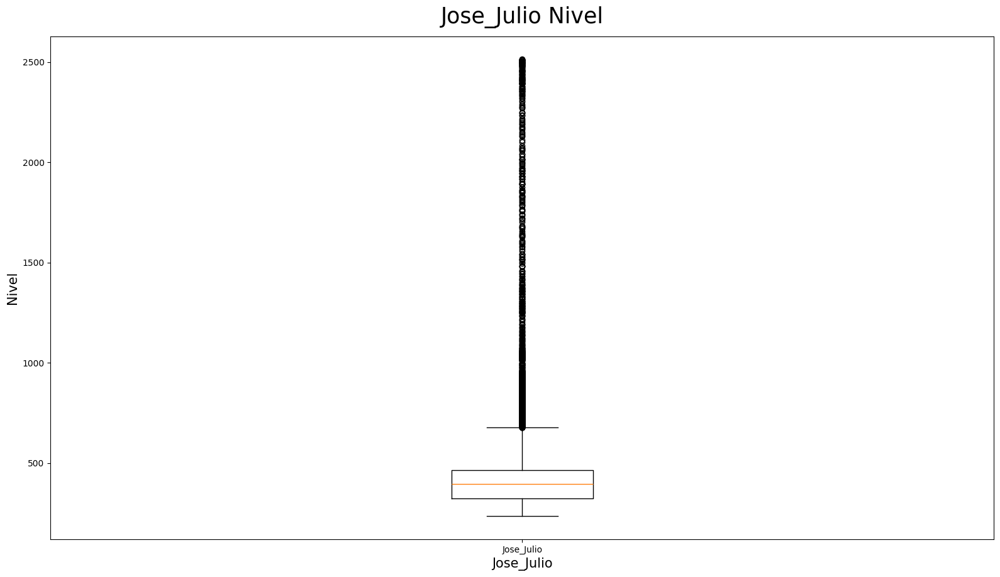

In [123]:
plotar_matplot('Jose_Julio Nivel', 'Jose_Julio', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Jose_Julio24, tipo='boxplot')

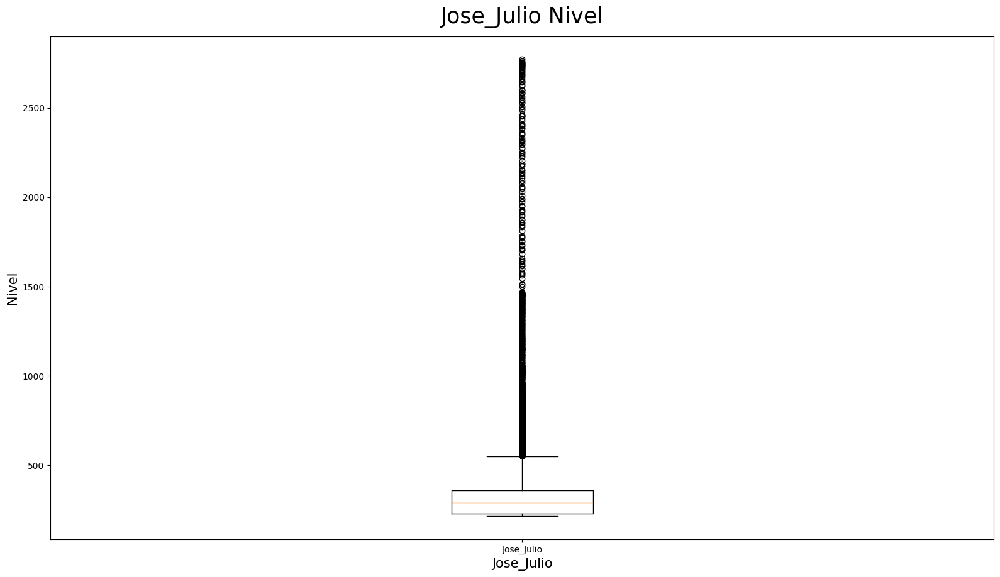

In [124]:
plotar_matplot('Jose_Julio Nivel', 'Jose_Julio', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Jose_Julio23, tipo='boxplot')

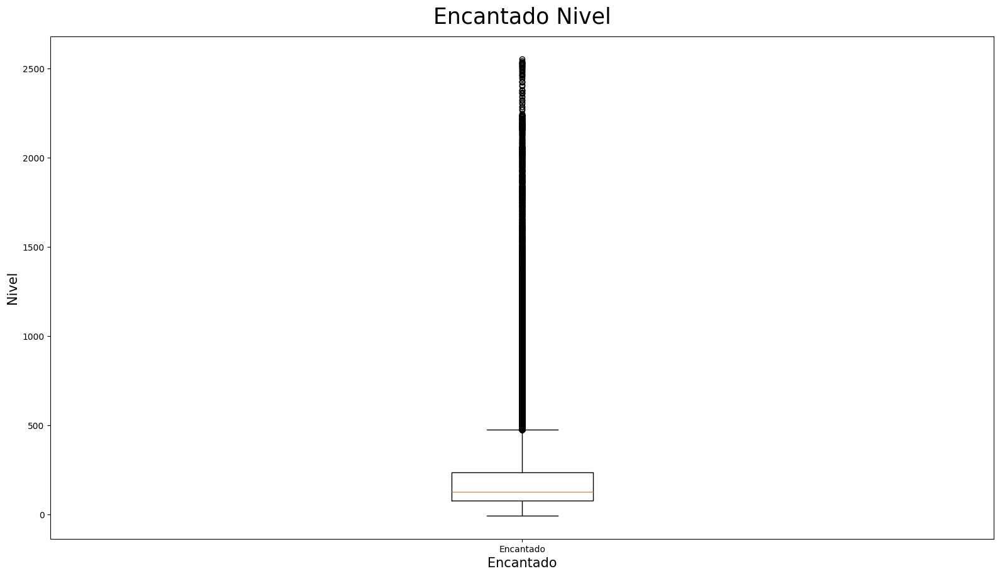

In [125]:
plotar_matplot('Encantado Nivel', 'Encantado', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Encantado_unico, tipo='boxplot')

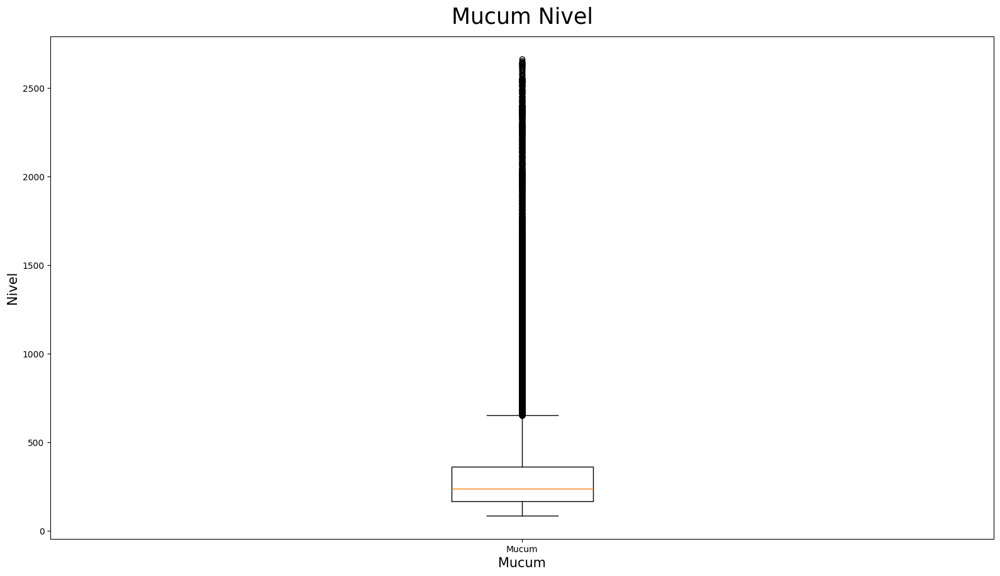

In [126]:
plotar_matplot('Mucum Nivel', 'Mucum', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Mucum_unico, tipo='boxplot')

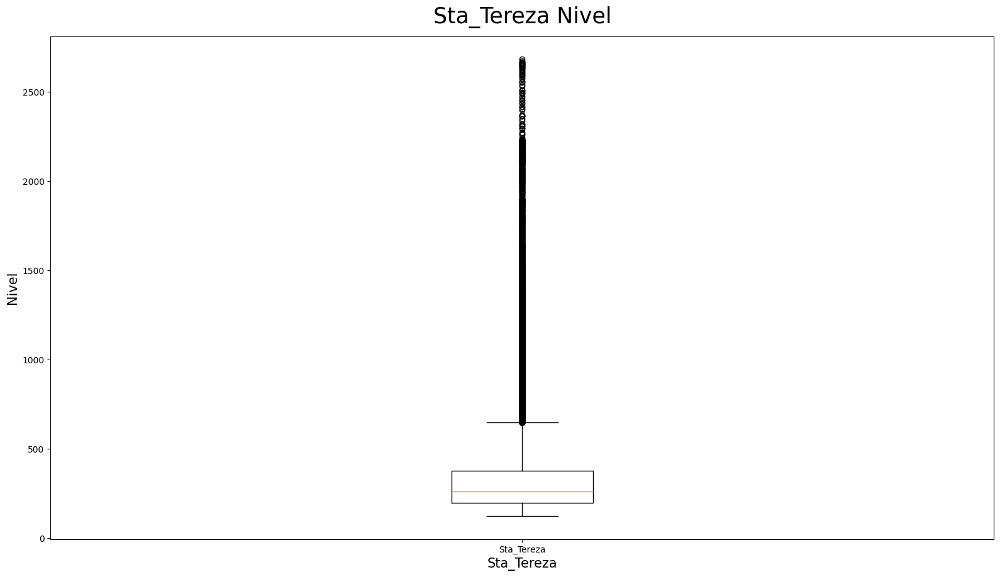

In [127]:
plotar_matplot('Sta_Tereza Nivel', 'Sta_Tereza', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Sta_Tereza_unico, tipo='boxplot')

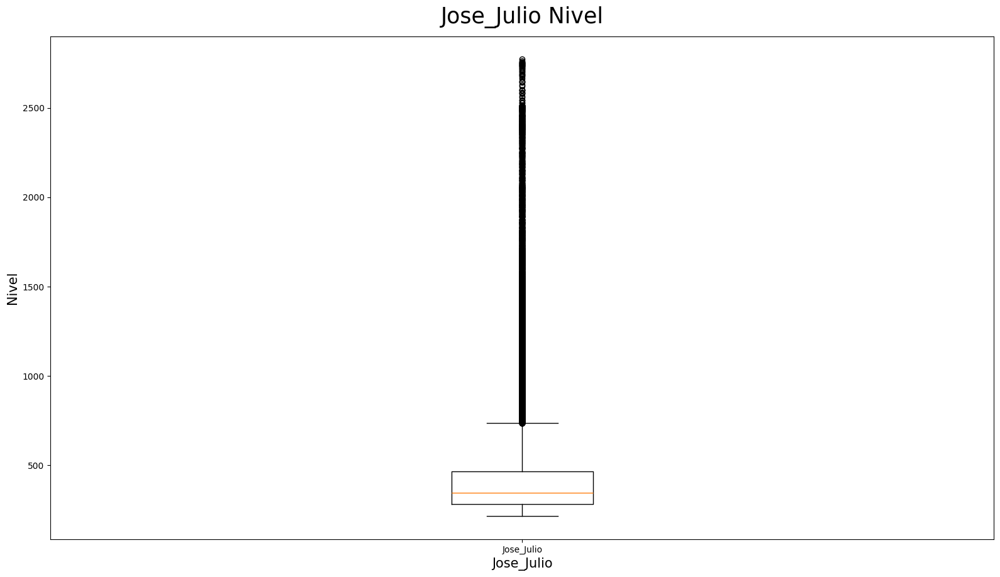

In [128]:
plotar_matplot('Jose_Julio Nivel', 'Jose_Julio', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Jose_Julio_unico, tipo='boxplot')

# Plot com seleção de intervalo (1 cidade)

In [129]:
def plotar_1_intervalo(titulo, labelx, labely, x, y, dataset1, label1, intervalo_data=None):

  fig = plt.figure(figsize=(15, 8))
  eixo = fig.add_axes([0, 0, 1, 1])

  # Filtrar o intervalo de datas, se fornecido
  if intervalo_data is not None:
      data_inicio, data_fim = intervalo_data
      dataset1 = dataset1[(dataset1[x] >= data_inicio) & (dataset1[x] <= data_fim)]

  # Plotar os dados com os labels fornecidos
  eixo.plot(x, y, data=dataset1, label=label1, linestyle='-')

  # Configurar título e rótulos dos eixos
  eixo.set_title(titulo, fontsize=25, pad=15)
  eixo.set_xlabel(labelx, fontsize=15)
  eixo.set_ylabel(labely, fontsize=15)

  # Adicionar a legenda
  eixo.legend()
  eixo = eixo

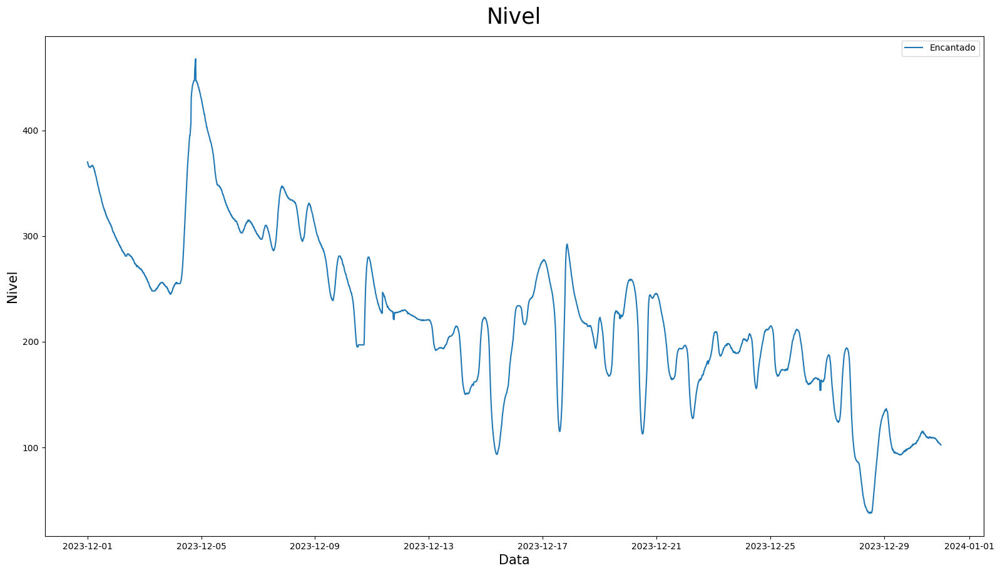

In [130]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-12-01')
data_fim = pd.to_datetime('2023-12-31')

# Chamando a função com intervalo de data
plotar_1_intervalo('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico,
                'Encantado',
                intervalo_data=(data_inicio, data_fim))

# 4 Graficos em um plot com seleção de intervalo

In [131]:
def plotar_matplot4(titulo, labelx, labely, x, y, dataset1, dataset2, dataset3, dataset4, label1, label2, label3, label4, intervalo_data=None):

  fig = plt.figure(figsize=(15, 8))
  eixo = fig.add_axes([0, 0, 1, 1])

  # Filtrar o intervalo de datas, se fornecido
  if intervalo_data is not None:
      data_inicio, data_fim = intervalo_data
      dataset1 = dataset1[(dataset1[x] >= data_inicio) & (dataset1[x] <= data_fim)]
      dataset2 = dataset2[(dataset2[x] >= data_inicio) & (dataset2[x] <= data_fim)]
      dataset3 = dataset3[(dataset3[x] >= data_inicio) & (dataset3[x] <= data_fim)]
      dataset4 = dataset4[(dataset4[x] >= data_inicio) & (dataset4[x] <= data_fim)]

  # Plotar os dados com os labels fornecidos
  eixo.plot(x, y, data=dataset1, label=label1, linestyle='-')
  eixo.plot(x, y, data=dataset2, label=label2, linestyle='-')
  eixo.plot(x, y, data=dataset3, label=label3, linestyle='-')
  eixo.plot(x, y, data=dataset4, label=label4, linestyle='-')

  # Configurar título e rótulos dos eixos
  eixo.set_title(titulo, fontsize=25, pad=15)
  eixo.set_xlabel(labelx, fontsize=15)
  eixo.set_ylabel(labely, fontsize=15)

  # Adicionar a legenda
  eixo.legend()
  eixo = eixo

### grafico nivel da agua 3 meses descartado

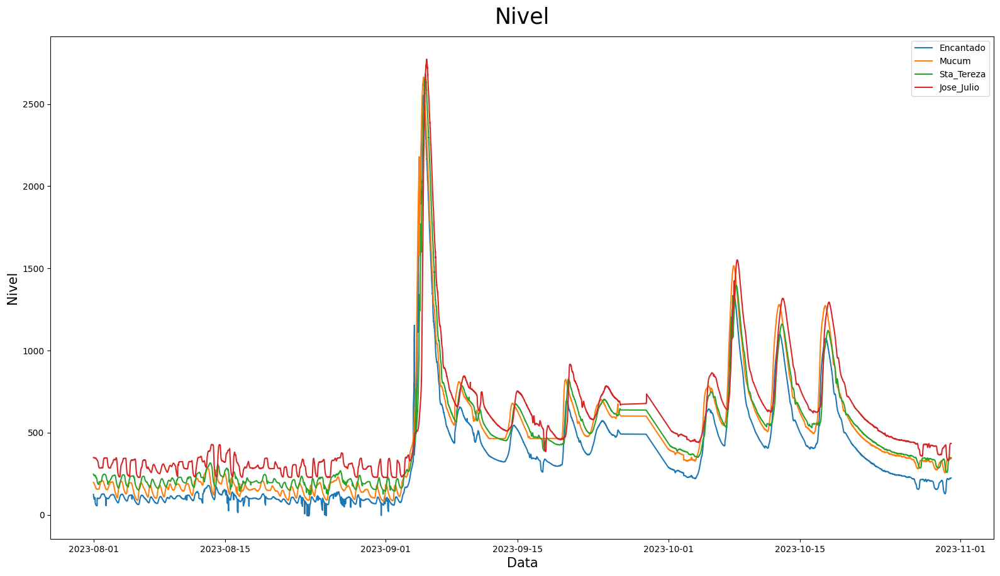

In [132]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-8-01')
data_fim = pd.to_datetime('2023-10-31')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

### grafico nivel da agua relevantes

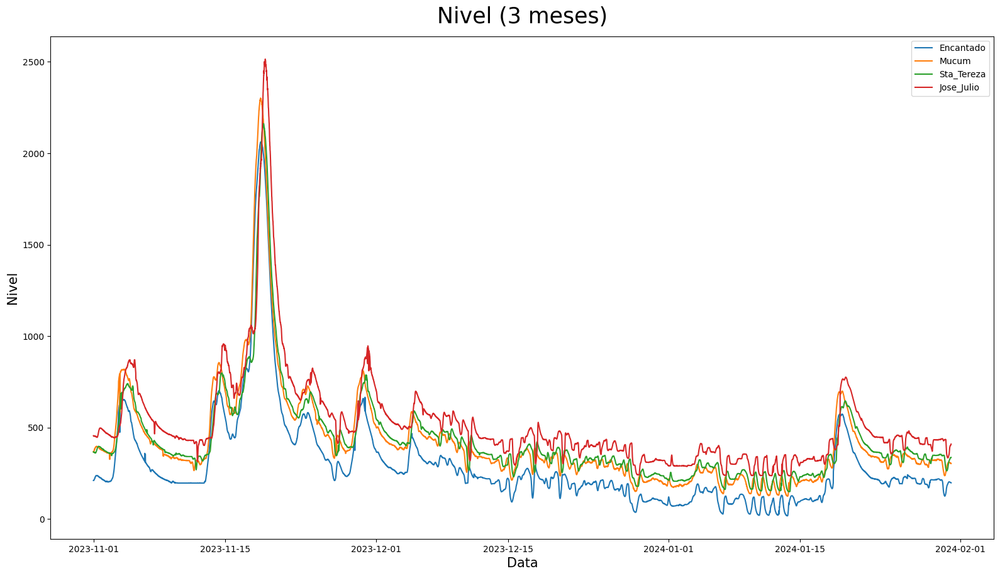

In [133]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel (3 meses)', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

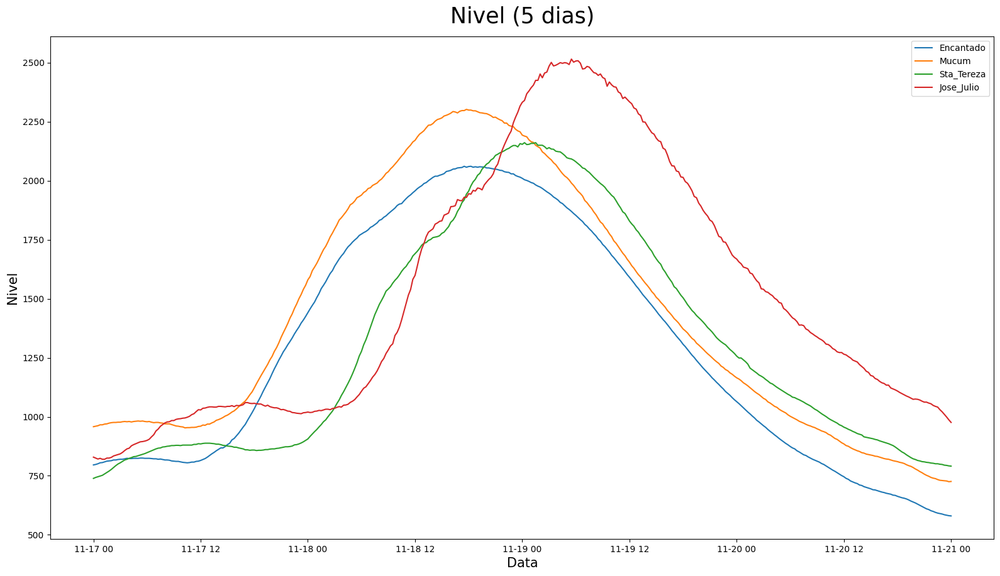

In [134]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-17')
data_fim = pd.to_datetime('2023-11-21')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel (5 dias)', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

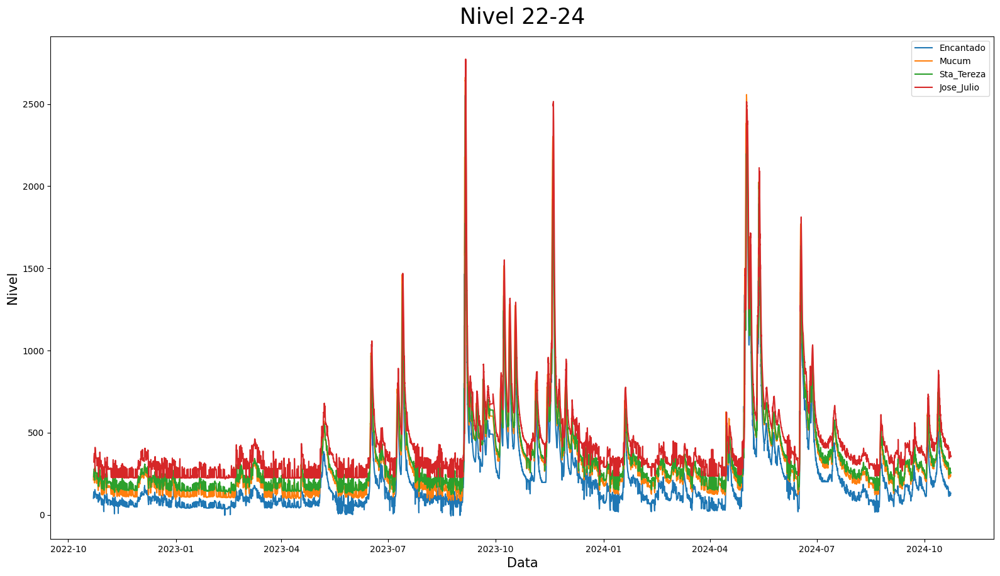

In [135]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-7-01')
data_fim = pd.to_datetime('2024-12-31')

# Chamando a função com intervalo de data
plotar_matplot4('Nivel 22-24', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

### Grafico Chuva 4 cidades

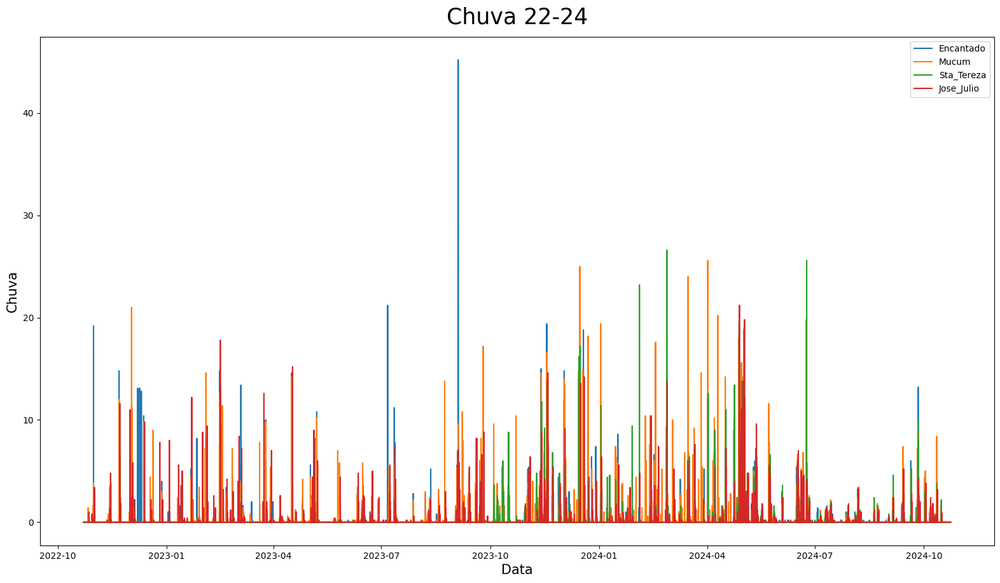

In [136]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-7-01')
data_fim = pd.to_datetime('2024-12-31')

# Chamando a função com intervalo de data
plotar_matplot4('Chuva 22-24', 'Data', 'Chuva', 'Data/Hora', 'Chuva(mm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

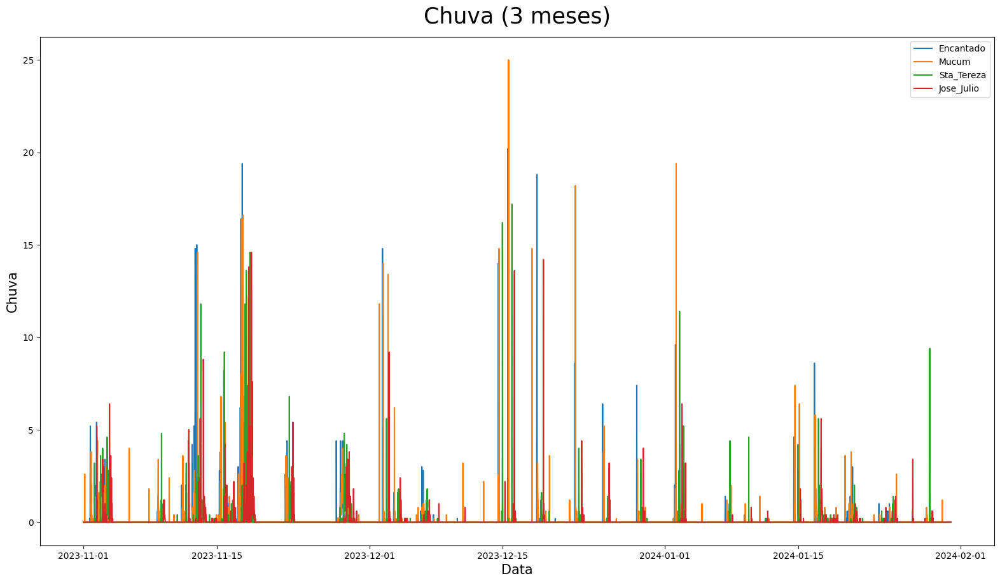

In [137]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

# Chamando a função com intervalo de data
plotar_matplot4('Chuva (3 meses)', 'Data', 'Chuva', 'Data/Hora', 'Chuva(mm)',
                df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,
                'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio',
                intervalo_data=(data_inicio, data_fim))

## Boxplot 4 em 1

In [138]:
def plotar_boxplot4(titulo, labelx, labely, x, y, dataset1, dataset2, dataset3, dataset4, label1, label2, label3, label4, intervalo_data=None):
  fig = plt.figure(figsize=(15, 8))
  eixo = fig.add_axes([0, 0, 1, 1])

  # Filtrar o intervalo de datas, se fornecido
  if intervalo_data is not None:
      data_inicio, data_fim = intervalo_data
      dataset1 = dataset1[(dataset1[x] >= data_inicio) & (dataset1[x] <= data_fim)]
      dataset2 = dataset2[(dataset2[x] >= data_inicio) & (dataset2[x] <= data_fim)]
      dataset3 = dataset3[(dataset3[x] >= data_inicio) & (dataset3[x] <= data_fim)]
      dataset4 = dataset4[(dataset4[x] >= data_inicio) & (dataset4[x] <= data_fim)]

  # Criar uma lista com os dados para o boxplot, ignorando dados nulos
  dados_boxplot = [
      dataset1[y].dropna().values,
      dataset2[y].dropna().values,
      dataset3[y].dropna().values,
      dataset4[y].dropna().values
  ]

  # Plotar o boxplot
  eixo.boxplot(dados_boxplot, labels=[label1, label2, label3, label4])

  # Configurar título e rótulos dos eixos
  eixo.set_title(titulo, fontsize=25, pad=15)
  eixo.set_xlabel(labelx, fontsize=15)
  eixo.set_ylabel(labely, fontsize=15)

  # Adicionar a legenda
  eixo.legend()
  eixo = eixo


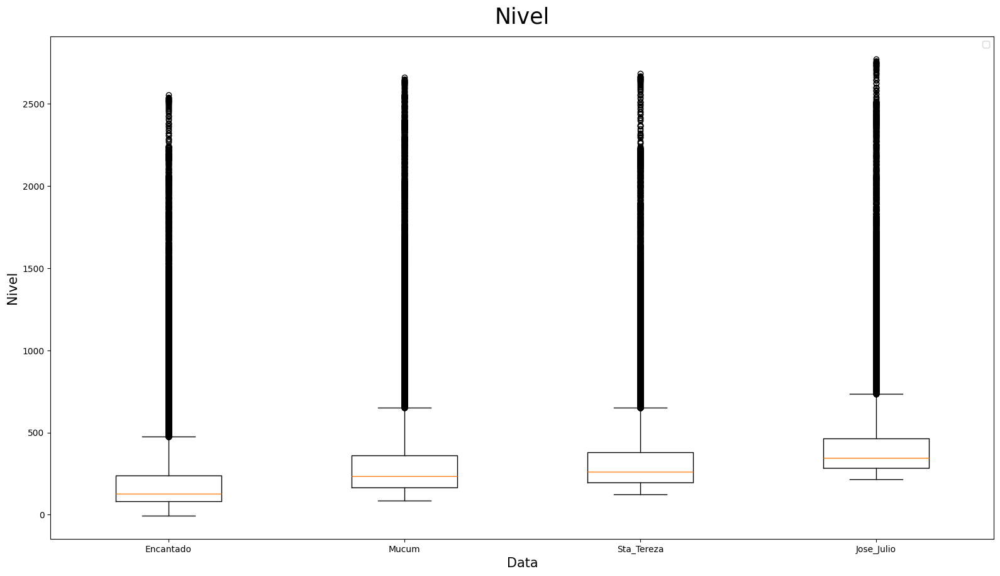

In [139]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-8-01')
data_fim = pd.to_datetime('2024-10-31')

# Chamando a função com intervalo de data
plotar_boxplot4('Nivel', 'Data', 'Nivel', 'Data/Hora', 'Nivel(cm)', df_Encantado_unico, df_Mucum_unico, df_Sta_Tereza_unico, df_Jose_Julio_unico,'Encantado', 'Mucum', 'Sta_Tereza', 'Jose_Julio', intervalo_data=(data_inicio, data_fim))

# Nivel e chuva

### Nivel em linha / chuva em barra sobreposta

In [140]:
import matplotlib.pyplot as plt

def plotar_chuva_nivel(dataset, titulo, labelx, labely1, labely2, coluna_data, coluna_chuva, coluna_nivel, intervalo_data=None):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    # Filtrar o intervalo de datas, se fornecido
    if intervalo_data is not None:
        data_inicio, data_fim = intervalo_data
        dataset = dataset[(dataset[coluna_data] >= data_inicio) & (dataset[coluna_data] <= data_fim)]

    # Eixo primário (eixo y à esquerda) para o nível da água (linha)
    ax1.plot(dataset[coluna_data], dataset[coluna_nivel], color='b', label='Nível da Água', linestyle='-')
    ax1.set_xlabel(labelx, fontsize=15)
    ax1.set_ylabel(labely1, color='b', fontsize=15)
    ax1.tick_params(axis='y', labelcolor='b')

    # Eixo secundário (eixo y à direita) para a chuva (barras)
    ax2 = ax1.twinx()
    ax2.bar(dataset[coluna_data], dataset[coluna_chuva], color='g', alpha=0.6, label='Chuva')
    ax2.set_ylabel(labely2, color='g', fontsize=15)
    ax2.tick_params(axis='y', labelcolor='g')

    # Título e legendas
    fig.suptitle(titulo, fontsize=25)  # Removi o parâmetro `pad`
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")

    plt.show()



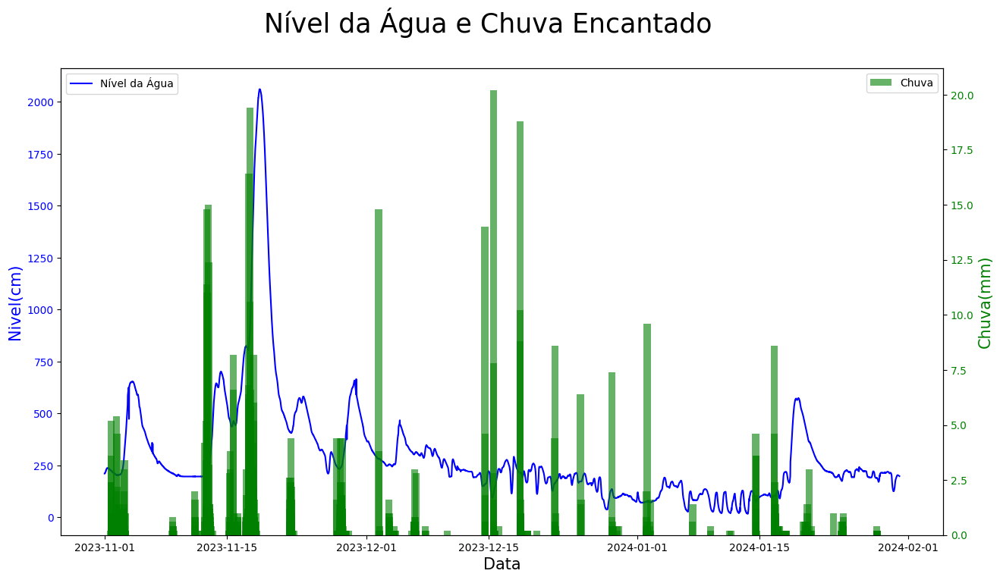

In [141]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

plotar_chuva_nivel(df_Encantado_unico,
                   "Nível da Água e Chuva Encantado",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim))

### Nivel em linha / chuva em barra sobreposta (Granulando ambos)
possivel selecionar agrupamento por dia, semana, mes ou hora

In [142]:
import matplotlib.pyplot as plt
import pandas as pd

def plotar_chuva_nivel_agrupa_ambos(dataset, titulo, labelx, labely1, labely2, coluna_data, coluna_chuva, coluna_nivel, intervalo_data=None, frequencia='D'):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    # Converter a coluna de data para datetime, caso ainda não esteja
    dataset[coluna_data] = pd.to_datetime(dataset[coluna_data])

    # Filtrar o intervalo de datas, se fornecido
    if intervalo_data is not None:
        data_inicio, data_fim = intervalo_data
        dataset = dataset[(dataset[coluna_data] >= data_inicio) & (dataset[coluna_data] <= data_fim)]

    # Agrupar por frequência especificada (D - dia, W - semana, M - mês, H - hora)
    dados_agrupados = dataset.resample(frequencia, on=coluna_data).agg({coluna_chuva: 'sum', coluna_nivel: 'mean'}).reset_index()

    # Eixo primário (eixo y à esquerda) para o nível da água (linha)
    ax1.plot(dados_agrupados[coluna_data], dados_agrupados[coluna_nivel], color='b', label='Nível da Água', linestyle='-')
    ax1.set_xlabel(labelx, fontsize=15)
    ax1.set_ylabel(labely1, color='b', fontsize=15)
    ax1.tick_params(axis='y', labelcolor='b')

    # Eixo secundário (eixo y à direita) para a chuva (barras)
    ax2 = ax1.twinx()
    ax2.bar(dados_agrupados[coluna_data], dados_agrupados[coluna_chuva], color='g', alpha=0.6, label='Chuva')
    ax2.set_ylabel(labely2, color='g', fontsize=15)
    ax2.tick_params(axis='y', labelcolor='g')



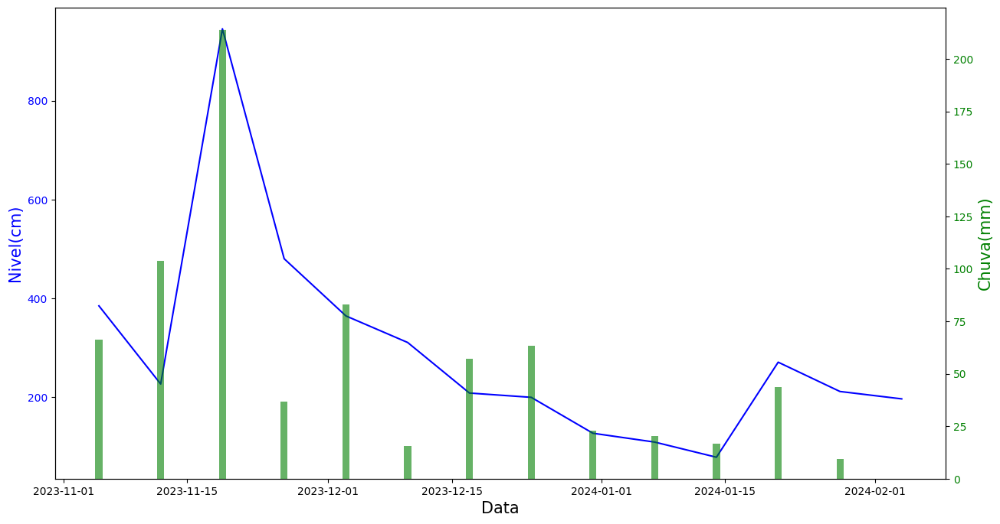

In [143]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

plotar_chuva_nivel_agrupa_ambos(df_Encantado_unico,
                   "Nível da Água e Chuva Encantado",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='W' )

### Nivel em linha / chuva em barra sobreposta (Granulando chuva)
possivel selecionar agrupamento por dia, semana, mes ou hora

In [144]:
import matplotlib.pyplot as plt
import pandas as pd

def plotar_chuva_nivel_agrupa_chuva(dataset, titulo, labelx, labely1, labely2, coluna_data, coluna_chuva, coluna_nivel, intervalo_data=None, frequencia='D'):
    fig, ax1 = plt.subplots(figsize=(15, 8))

    # Converter a coluna de data para datetime, caso ainda não esteja
    dataset[coluna_data] = pd.to_datetime(dataset[coluna_data])

    # Filtrar o intervalo de datas, se fornecido
    if intervalo_data is not None:
        data_inicio, data_fim = intervalo_data
        dataset = dataset[(dataset[coluna_data] >= data_inicio) & (dataset[coluna_data] <= data_fim)]

    # Agrupar os dados de chuva pela frequência especificada (D - dia, W - semana, M - mês, H - hora)
    dados_chuva_agrupados = dataset.resample(frequencia, on=coluna_data).agg({coluna_chuva: 'sum'}).reset_index()

    # Eixo primário (eixo y à esquerda) para o nível da água (linha)
    ax1.plot(dataset[coluna_data], dataset[coluna_nivel], color='b', label='Nível da Água', linestyle='-')
    ax1.set_xlabel(labelx, fontsize=15)
    ax1.set_ylabel(labely1, color='b', fontsize=15)
    ax1.tick_params(axis='y', labelcolor='b')

    # Eixo secundário (eixo y à direita) para a chuva (barras)
    ax2 = ax1.twinx()
    ax2.bar(dados_chuva_agrupados[coluna_data], dados_chuva_agrupados[coluna_chuva], color='g', alpha=0.6, label='Chuva')
    ax2.set_ylabel(labely2, color='g', fontsize=15)
    ax2.tick_params(axis='y', labelcolor='g')

    # Título e legendas
    fig.suptitle(titulo, fontsize=25)
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")

    plt.show()


#### cidades intervalo 23-11-01 ate 24-1-31 (3 meses)

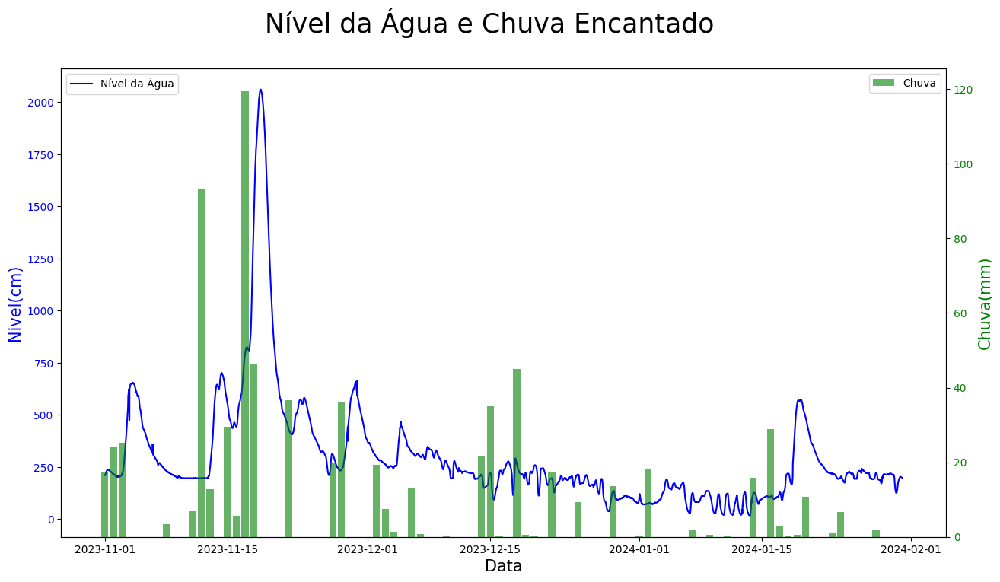

In [145]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

plotar_chuva_nivel_agrupa_chuva(df_Encantado_unico,
                   "Nível da Água e Chuva Encantado",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

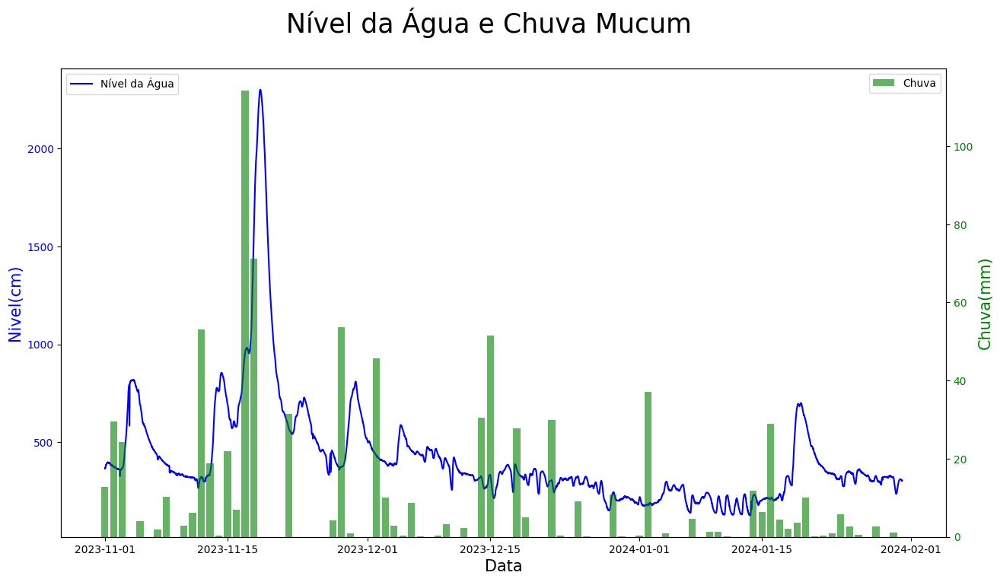

In [146]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

plotar_chuva_nivel_agrupa_chuva(df_Mucum_unico,
                   "Nível da Água e Chuva Mucum",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

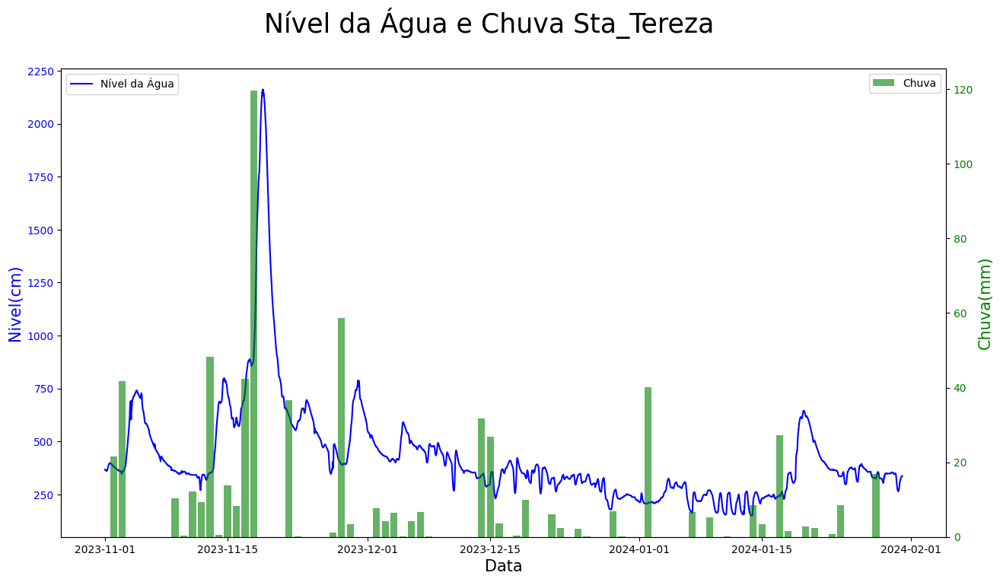

In [147]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

plotar_chuva_nivel_agrupa_chuva(df_Sta_Tereza_unico,
                   "Nível da Água e Chuva Sta_Tereza",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

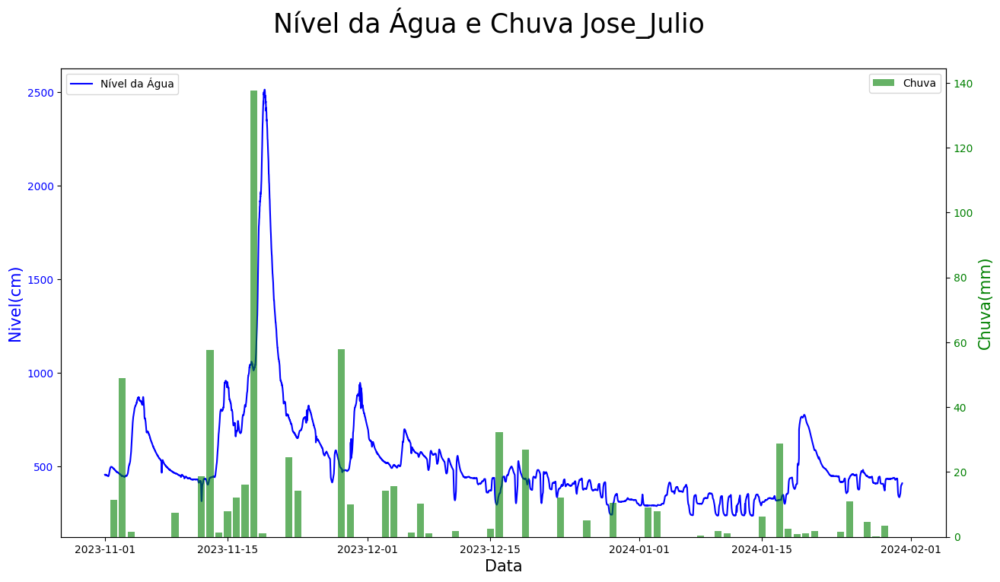

In [148]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-1-31')

plotar_chuva_nivel_agrupa_chuva(df_Jose_Julio_unico,
                   "Nível da Água e Chuva Jose_Julio",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

#### cidades intervalo 22-11-01 ate 24-10-31 (2anos separado por ano)

---




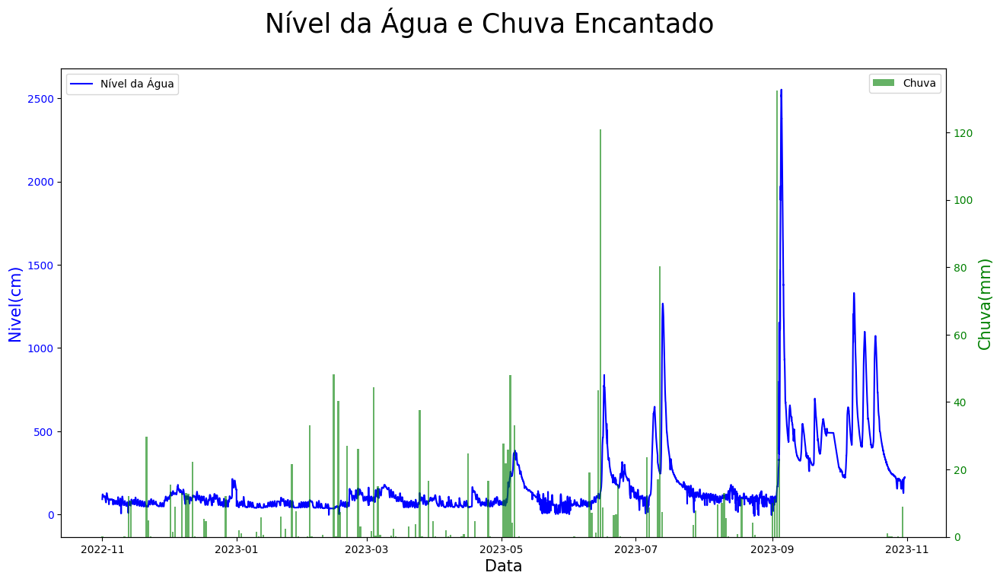

In [149]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-11-01')
data_fim = pd.to_datetime('2023-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Encantado_unico,
                   "Nível da Água e Chuva Encantado",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

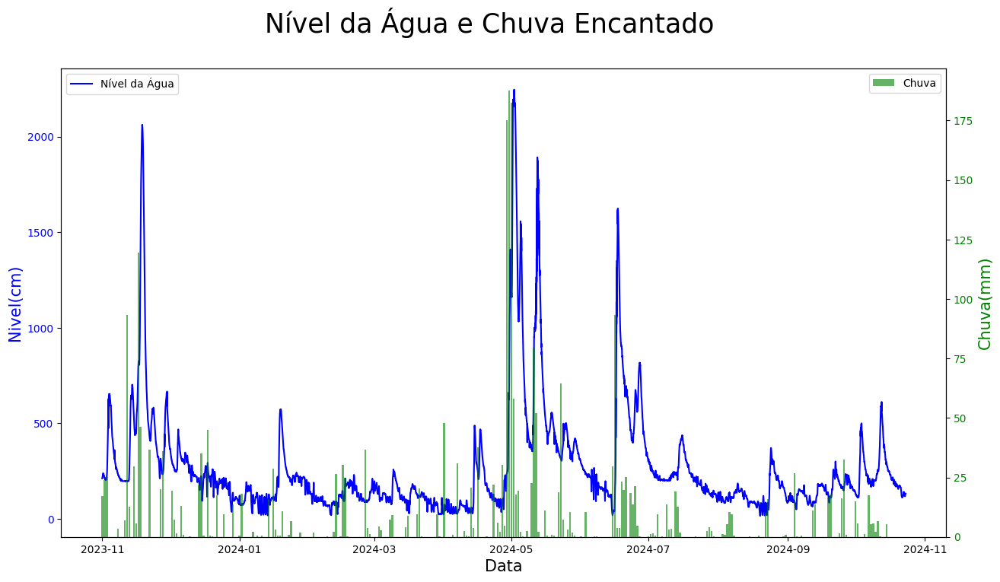

In [150]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Encantado_unico,
                   "Nível da Água e Chuva Encantado",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

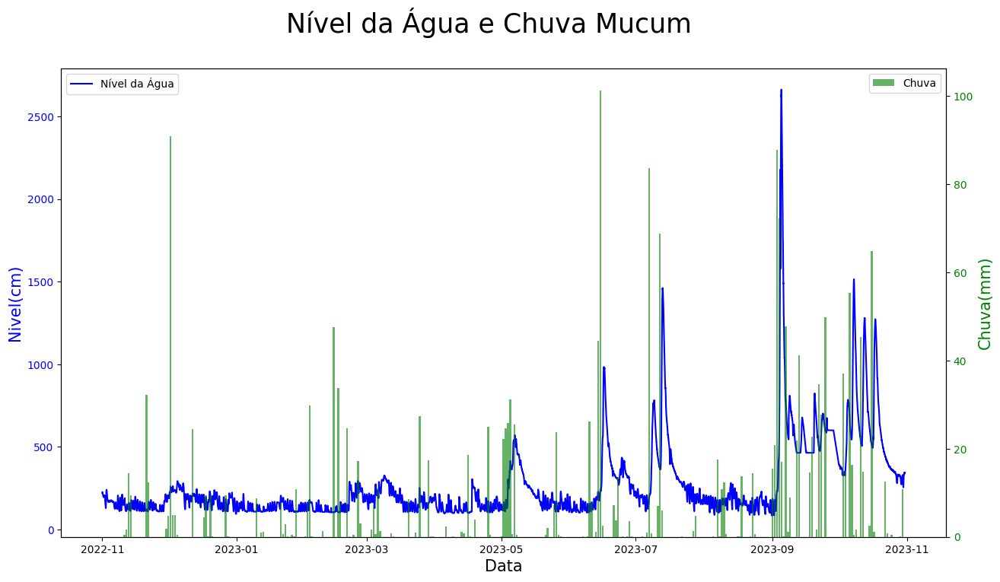

In [151]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-11-01')
data_fim = pd.to_datetime('2023-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Mucum_unico,
                   "Nível da Água e Chuva Mucum",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

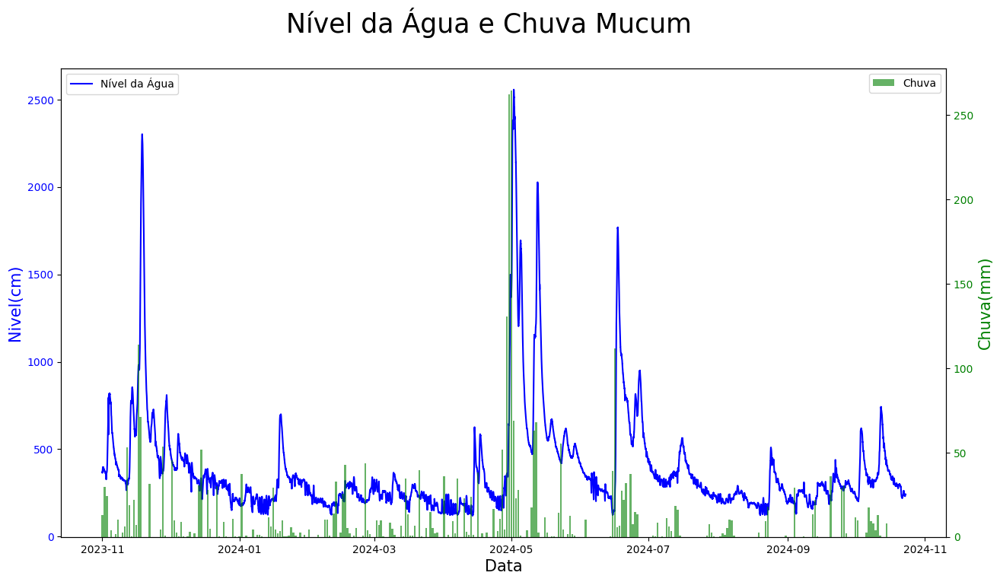

In [152]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Mucum_unico,
                   "Nível da Água e Chuva Mucum",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

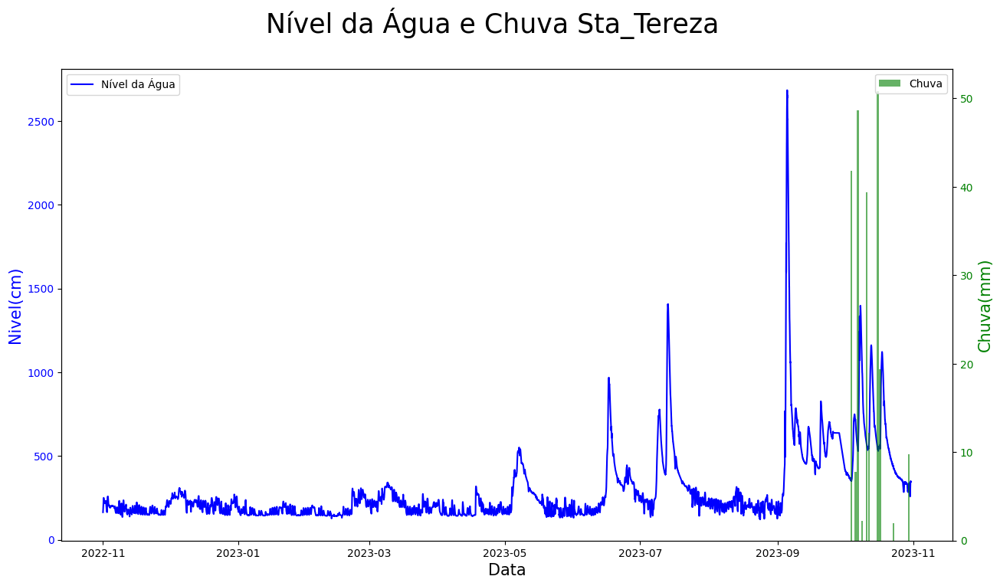

In [153]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-11-01')
data_fim = pd.to_datetime('2023-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Sta_Tereza_unico,
                   "Nível da Água e Chuva Sta_Tereza",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

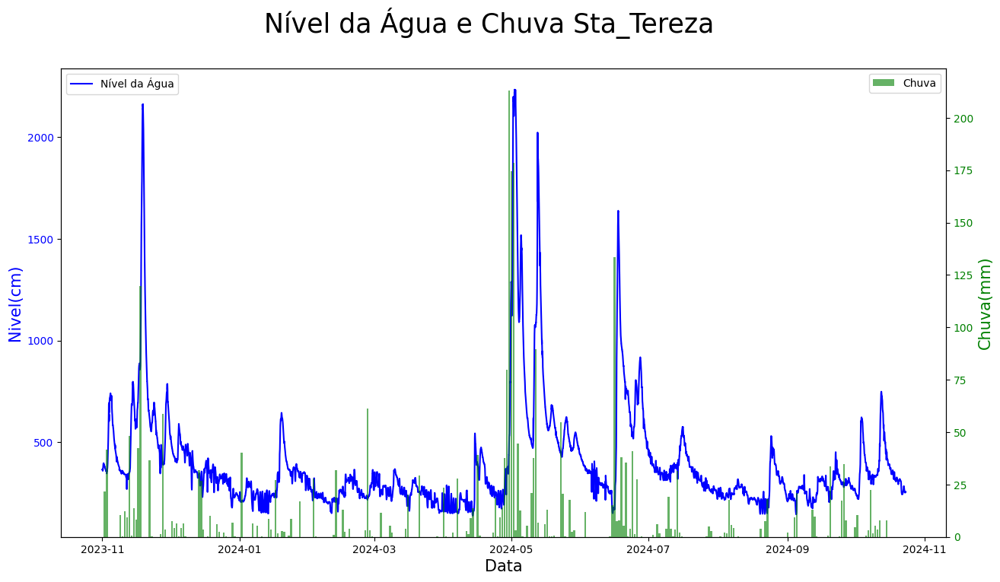

In [154]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Sta_Tereza_unico,
                   "Nível da Água e Chuva Sta_Tereza",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

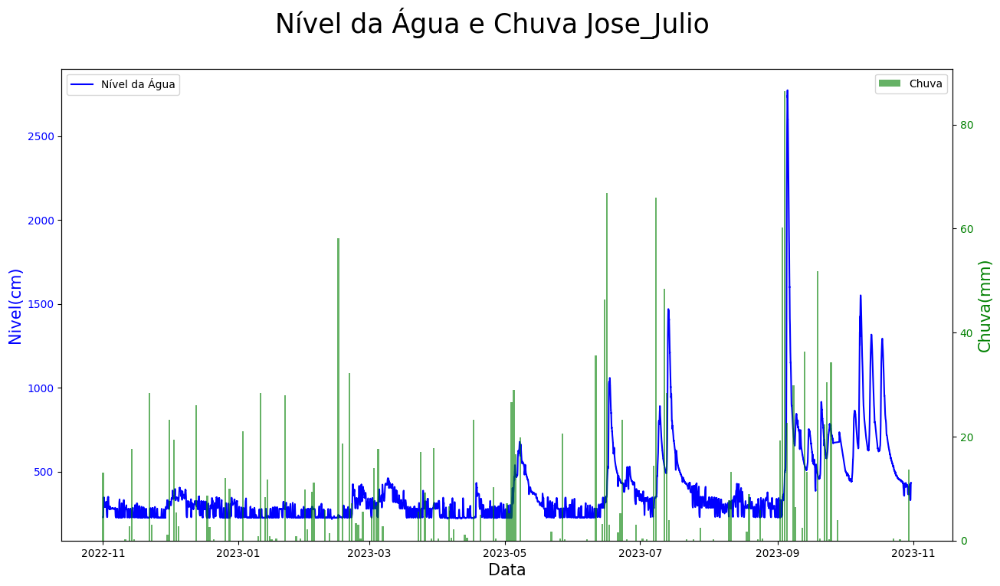

In [155]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2022-11-01')
data_fim = pd.to_datetime('2023-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Jose_Julio_unico,
                   "Nível da Água e Chuva Jose_Julio",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

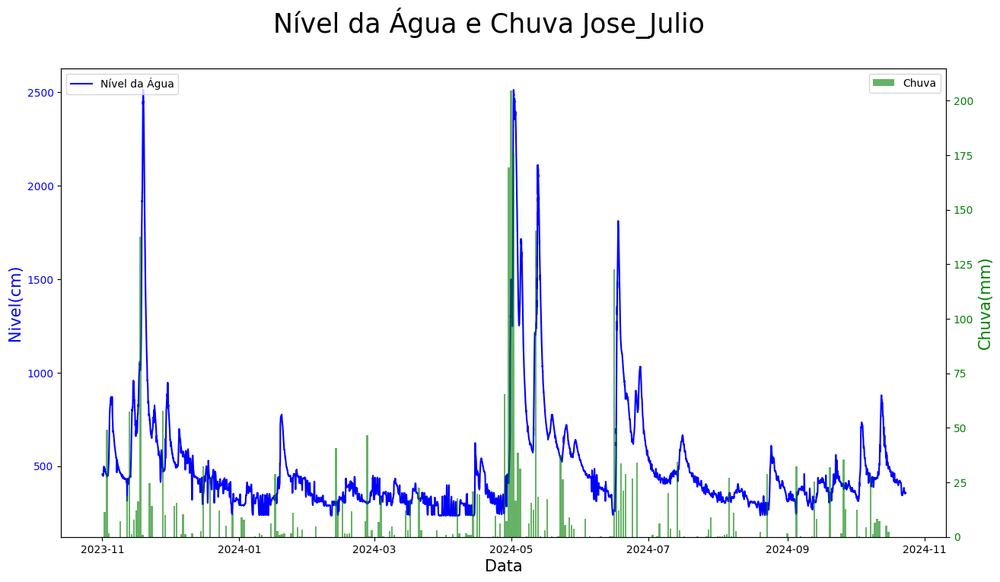

In [156]:
# Definir intervalo de data
data_inicio = pd.to_datetime('2023-11-01')
data_fim = pd.to_datetime('2024-10-31')

plotar_chuva_nivel_agrupa_chuva(df_Jose_Julio_unico,
                   "Nível da Água e Chuva Jose_Julio",
                   "Data",
                   "Nivel(cm)",
                   "Chuva(mm)",
                   coluna_data='Data/Hora',
                   coluna_chuva='Chuva(mm)',
                   coluna_nivel='Nivel(cm)',
                   intervalo_data=(data_inicio, data_fim),
                   frequencia='D' )

# Calcular correlação

In [164]:
niveis = [df_Encantado_unico['Nivel(cm)'],df_Mucum_unico['Nivel(cm)'],df_Sta_Tereza_unico['Nivel(cm)'],df_Jose_Julio_unico['Nivel(cm)']]
niveis = pd.concat(niveis, axis=1)
niveis.columns = ['Nivel_Encantado', 'Nivel_Mucum', 'Nivel_Sta_Tereza', 'Nivel_Jose_Julio']


correlacao_niveis = niveis.corr()


chuvas = [df_Encantado_unico['Chuva(mm)'],df_Mucum_unico['Chuva(mm)'],df_Sta_Tereza_unico['Chuva(mm)'],df_Jose_Julio_unico['Chuva(mm)']]
chuvas = pd.concat(chuvas, axis=1)
chuvas.columns = ['chuva_Encantado', 'chuva_Mucum', 'chuva_Sta_Tereza', 'chuva_Jose_Julio']

correlacao_chuvas= chuvas.corr()

vazoes = [df_Encantado_unico['Vazao(m3/s)'],df_Mucum_unico['Vazao(m3/s)'],df_Jose_Julio_unico['Vazao(m3/s)']]
vazoes = pd.concat(vazoes, axis=1)
vazoes.columns = ['Vazao_Encantado', 'Vazao_Mucum', 'Vazao_Jose_Julio']

correlacao_vazoes = vazoes.corr()

correlacoes = [correlacao_niveis, correlacao_chuvas, correlacao_vazoes]
correlacoes = pd.concat(correlacoes, axis=1)

df_geral = [niveis, chuvas, vazoes]
df_geral = pd.concat(df_geral, axis=1)
df_geral

correlacao_geral = df_geral.corr()
correlacao_geral

,Nivel_Encantado,Nivel_Mucum,Nivel_Sta_Tereza,Nivel_Jose_Julio,chuva_Encantado,chuva_Mucum,chuva_Sta_Tereza,chuva_Jose_Julio,Vazao_Encantado,Vazao_Mucum,Vazao_Jose_Julio
Nivel_Encantado,1.000000,0.994339,0.992236,0.987372,0.089071,0.112688,0.166240,0.175212,0.611151,0.977683,0.599772
Nivel_Mucum,0.994339,1.000000,0.992954,0.987679,0.086838,0.112241,0.169570,0.182627,0.606065,0.975663,0.595438
Nivel_Sta_Tereza,0.992236,0.992954,1.000000,0.994420,0.072818,0.094539,0.138039,0.152635,0.612519,0.966695,0.608606
Nivel_Jose_Julio,0.987372,0.987679,0.994420,1.000000,0.073934,0.095634,0.144180,0.147490,0.598183,0.962157,0.610069
chuva_Encantado,0.089071,0.086838,0.072818,0.073934,1.000000,0.247318,0.095553,0.086530,0.020498,0.090324,0.044069
chuva_Mucum,0.112688,0.112241,0.094539,0.095634,0.247318,1.000000,0.131433,0.096335,0.071698,0.118133,0.046491
chuva_Sta_Tereza,0.166240,0.169570,0.138039,0.144180,0.095553,0.131433,1.000000,0.150772,0.070076,0.179254,0.092140
chuva_Jose_Julio,0.175212,0.182627,0.152635,0.147490,0.086530,0.096335,0.150772,1.000000,0.092939,0.198463,0.082142
Vazao_Encantado,0.611151,0.606065,0.612519,0.598183,0.020498,0.071698,0.070076,0.092939,1.000000,0.586461,0.245440
Vazao_Mucum,0.977683,0.975663,0.966695,0.962157,0.090324,0.118133,0.179254,0.198463,0.586461,1.000000,0.562455


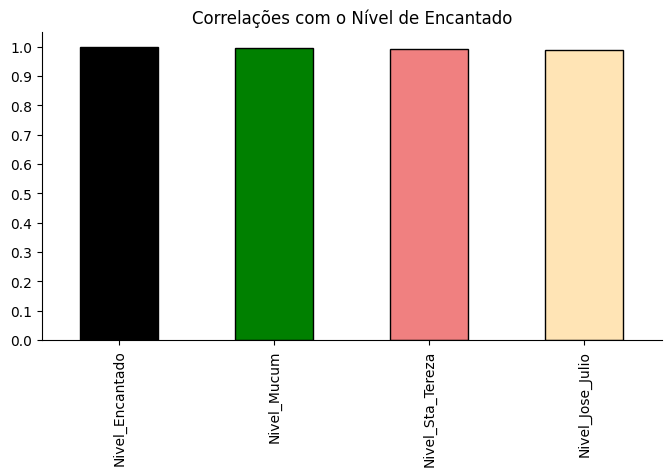

In [165]:
from matplotlib import pyplot as plt
correlacao_niveis['Nivel_Encantado'].plot(kind='bar', figsize=(8, 4), color = ['black','g','lightcoral','moccasin'], edgecolor='black', title='Correlações com o Nível de Encantado')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.show()

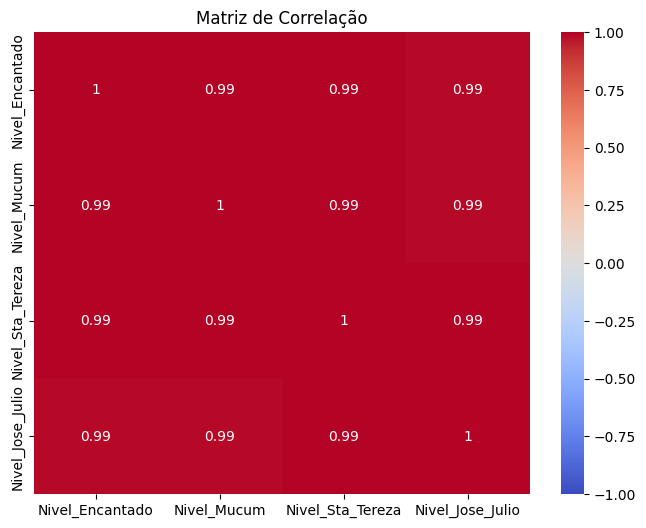

In [166]:
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
sns.heatmap(correlacao_niveis, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlação')
plt.show()

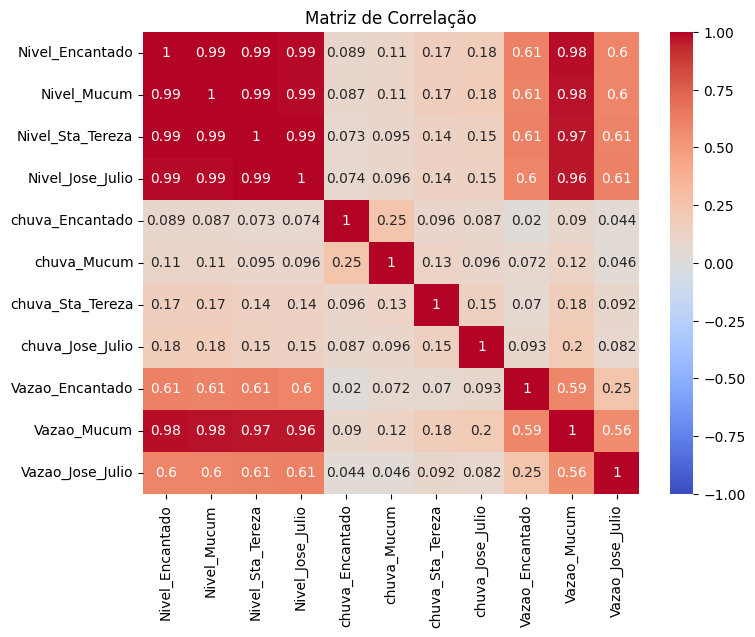

In [167]:
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
sns.heatmap(correlacao_geral, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlação')
plt.show()

In [168]:
df_geral.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69962 entries, 0 to 69961
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Nivel_Encantado   69962 non-null  float64
 1   Nivel_Mucum       69962 non-null  float64
 2   Nivel_Sta_Tereza  69962 non-null  float64
 3   Nivel_Jose_Julio  69962 non-null  float64
 4   chuva_Encantado   69962 non-null  float64
 5   chuva_Mucum       69962 non-null  float64
 6   chuva_Sta_Tereza  69962 non-null  float64
 7   chuva_Jose_Julio  69962 non-null  float64
 8   Vazao_Encantado   69962 non-null  float64
 9   Vazao_Mucum       69962 non-null  float64
 10  Vazao_Jose_Julio  69936 non-null  float64
dtypes: float64(11)
memory usage: 5.9 MB


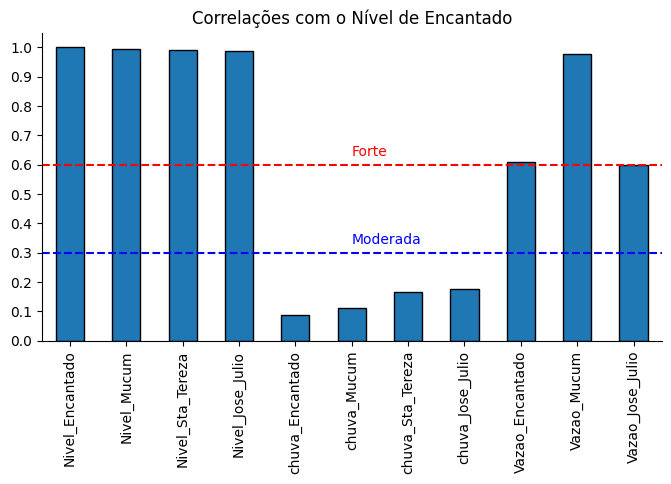

In [169]:
correlacao_geral['Nivel_Encantado'].plot(kind='bar', figsize=(8, 4), edgecolor='black', title='Correlações com o Nível de Encantado')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.yticks(np.arange(0, 1.1, 0.1))
# Adicionar linha horizontal
plt.axhline(y=0.6, color='r', linestyle='--')
plt.axhline(y=0.3, color='b', linestyle='--')
# Adicionar texto acima da linha
plt.text(5, 0.62, 'Forte', color='r', ha='left', va='bottom')
plt.text(5, 0.32, 'Moderada', color='b', ha='left', va='bottom')
plt.show()

## Historiogramas das variáveis




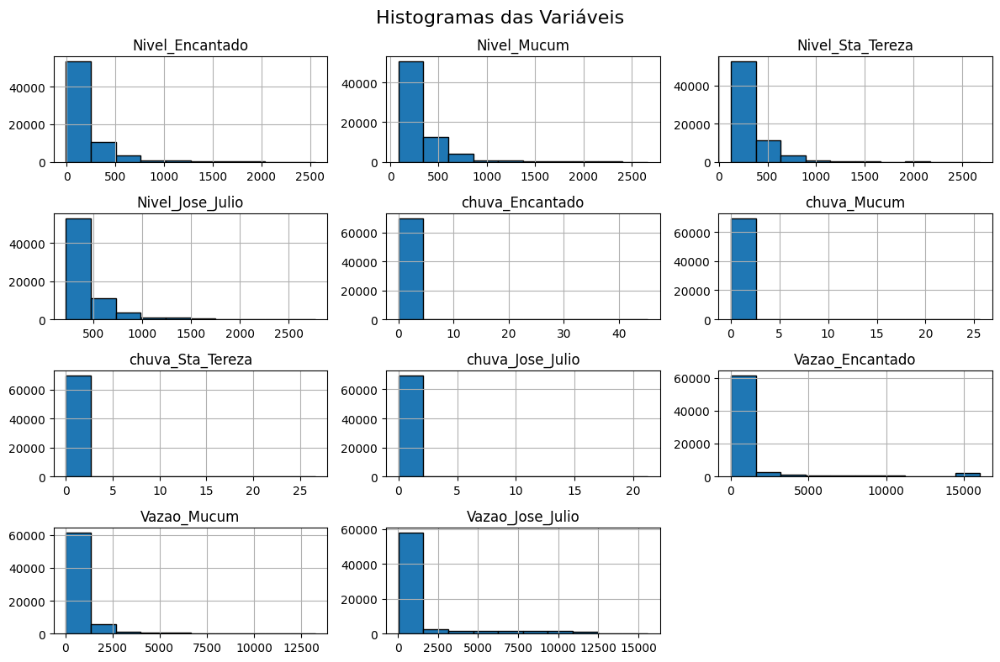

In [170]:
df_geral.hist(figsize=(12, 8), bins=10, edgecolor='black')
plt.suptitle('Histogramas das Variáveis', fontsize=16)
plt.tight_layout()  # Adjusts subplot params for a tight layout
plt.show()

# Média, Mediana e Desvio Padrão

In [171]:

# Calcula a média, mediana e desvio padrão
estatisticas_descritivas = df_geral.agg(['mean', 'median', 'std'])


# Combina as estatísticas em um único DataFrame
tabela_estatisticas = pd.DataFrame({'Média': estatisticas_descritivas.loc['mean'],
                                 'Mediana': estatisticas_descritivas.loc['median'],
                                 'Desvio Padrão': estatisticas_descritivas.loc['std']})
tabela_estatisticas

,Média,Mediana,Desvio Padrão
Nivel_Encantado,217.412942,128.000000,262.510009
Nivel_Mucum,322.920991,236.000000,282.172946
Nivel_Sta_Tereza,339.706037,261.666667,252.774495
Nivel_Jose_Julio,428.206324,347.000000,266.445917
chuva_Encantado,0.058506,0.000000,0.523490
chuva_Mucum,0.075198,0.000000,0.599527
chuva_Sta_Tereza,0.042952,0.000000,0.429895
chuva_Jose_Julio,0.061346,0.000000,0.461734
Vazao_Encantado,1227.769521,146.100000,3304.339024
Vazao_Mucum,684.321476,273.710000,1284.293176
